**This notebook contains followings:**
* Data Merging
* Feature Extraction
* Model Selection
* Hyperparameter Tuning
* Results on All Datasets
* References
* Conclusion
* Additional Resources


In [1]:
#importing necessary libraries
import os
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import scipy
from scipy.stats import entropy
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score
from sklearn import preprocessing
import xgboost as xgb
import catboost as cb
import lightgbm as lgbm
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
import plotly.express as px
import plotly.graph_objects as go
import optuna
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert, chirp
import fitter
from distfit import distfit

# Merging Data

In [2]:
#Data paths
dataset_path_1st = r"C:\Users\User\Desktop\UNI\MasterThesis\maintenance prediction\data\kaggle\1st_test\1st_test"
dataset_path_2nd = r"C:\Users\User\Desktop\UNI\MasterThesis\maintenance prediction\data\kaggle\2nd_test\2nd_test"
dataset_path_3rd = r"C:\Users\User\Desktop\UNI\MasterThesis\maintenance prediction\data\kaggle\3rd_test\4th_test\txt"

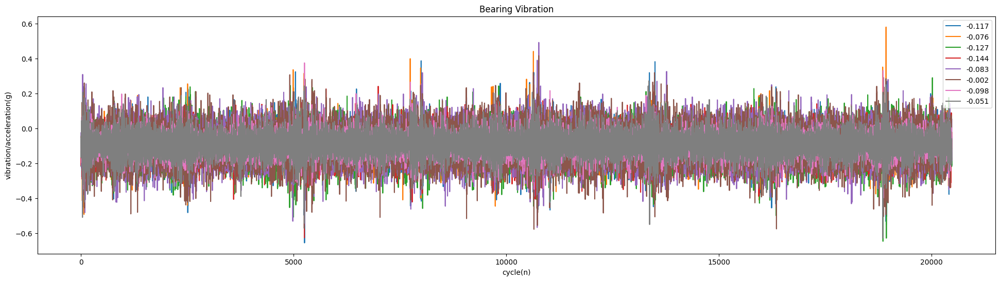

In [3]:
# Test for the first file

#Good condition bearing
dataset = pd.read_csv(r"C:\Users\User\Desktop\UNI\MasterThesis\maintenance prediction\data\kaggle\1st_test\1st_test\2003.10.22.12.09.13", sep='\t')

#Bad condition bearing
#dataset = pd.read_csv(r"C:\Users\User\Desktop\UNI\MasterThesis\maintenance prediction\data\kaggle\1st_test\1st_test\2003.11.25.23.39.56", sep='\t')
ax = dataset.plot(figsize = (24,6), title= "Bearing Vibration" , legend = True)
ax.set(xlabel="cycle(n)", ylabel="vibration/acceleration(g)")
plt.show()

# Feature Extraction #

In this section several signal-based statistical features has been extracted from the data                                 
**Definition and formula of the features:**
* ***Absolute Mean*** $$\overline{x} = \frac{1}{N}\sum_{i=1}^{N}|x_i| $$

* ***Standart Deviation:*** $$\sigma         = \sqrt{\frac{1}{N}\sum_{i=1}^{N}(x_i - \overline{x})^2}$$
* ***Skewness:*** 
Asymmetry of a signal distribution. Faults can impact distribution symmetry and therefore increase the level of skewness.
$$\mathrm{Sk} = \frac{1}{N}\sum_{i=1}^{N}\frac{(x_i-\overline{x})^3}{\sigma^3}$$
* ***Kurtosis:***
Length of the tails of a signal distribution, or equivalently, how outlier prone the signal is. Developing faults can increase the number of outliers, and therefore increase the value of the kurtosis metric.
$$\mathrm{K} = \frac{1}{N}\sum_{i=1}^{N}\frac{(x_i-\overline{x})^4}{\sigma^4}$$
* ***Entropy:***$$ H(X) = -\sum_{i=1}^{N} P(x_i)\log{P(x_i)} $$
                            
* ***RMS:*** $$x_{rms} =\sqrt{(\frac{1}{N})\sum_{i=1}^{N}(x)^{2}}$$

* ***Peak to Peak:*** $$ x_p = \max \mathrm{value} - \min \mathrm{value}$$

* ***Crest Factor:*** 
Peak value divided by the RMS. Faults often first manifest themselves in changes in the peakiness of a signal before they manifest in the energy represented by the signal root mean squared. The crest factor can provide an early warning for faults when they first develop. 
$$x_{crest} =\frac{\max \mathrm{value}}{\mathrm{x_{rms}}}$$

* ***Clearence Factor:*** 
Peak value divided by the squared mean value of the square roots of the absolute amplitudes. For rotating machinery, this feature is maximum for healthy bearings and goes on decreasing for defective ball, defective outer race, and defective inner race respectively. The clearance factor has the highest separation ability for defective inner race faults.
$$ x_{clear} = \frac{x_p}{(\frac{1}{N}\sum_{i=1}^{N}\sqrt{|x_i|})^2}  $$

* ***Shape Factor:*** 
RMS divided by the mean of the absolute value. Shape factor is dependent on the signal shape while being independent of the signal dimensions.
$$\frac{x_{rms}}{\overline{x}}$$

* ***Impulse:*** 
Compare the height of a peak to the mean level of the signal.
$$\frac{\max \mathrm{value}}{\overline{x}}  $$


In [4]:
# Root Mean Squared Sum
def calculate_rms(df):
    result = []
    for col in df:
        r = np.sqrt((df[col]**2).sum() / len(df[col]))
        result.append(r)
    return result

# extract peak-to-peak features
def calculate_p2p(df):
    return np.array(df.max().abs() + df.min().abs())

# extract shannon entropy (cut signals to 500 bins)
def calculate_entropy(df):
    ent = []
    for col in df:
        ent.append(entropy(pd.cut(df[col], 500).value_counts()))
    return np.array(ent)
# extract clearence factor
def calculate_clearence(df):
    result = []
    for col in df:
        r = ((np.sqrt(df[col].abs())).sum() / len(df[col]))**2
        result.append(r)
    return result

def time_features(dataset_path, id_set=None):
    features = ['mean','std','skew','kurtosis','entropy','rms','max','p2p', 'crest', 'clearence', 'shape', 'impulse', 
                "freq_band_1" , "freq_band_2" , "freq_band_3" , "freq_band_4" , "freq_band_5"]
    cols1 = ['B1_x','B1_y','B2_x','B2_y','B3_x','B3_y','B4_x','B4_y']
    cols2 = ['B1','B2','B3','B4']

    #From the specs of Kaggle NASA dataset
    Fsamp = 20000
    Ts = 1/Fsamp
    
    # initialize
    if id_set == 1:
        columns = [c+'_'+tf for c in cols1 for tf in features]
        data = pd.DataFrame(columns=columns)
    else:
        columns = [c+'_'+tf for c in cols2 for tf in features]
        data = pd.DataFrame(columns=columns)
        
        
    for filename in os.listdir(dataset_path):
        # read dataset
        raw_data = pd.read_csv(os.path.join(dataset_path, filename), sep='\t')
        
        # time features
        mean_abs = np.array(raw_data.abs().mean())
        std = np.array(raw_data.std())
        skew = np.array(raw_data.skew())
        kurtosis = np.array(raw_data.kurtosis())
        entropy = calculate_entropy(raw_data)
        rms = np.array(calculate_rms(raw_data))
        max_abs = np.array(raw_data.abs().max())
        p2p = calculate_p2p(raw_data)
        crest = max_abs/rms
        clearence = np.array(calculate_clearence(raw_data))
        shape = rms / mean_abs
        impulse = max_abs / mean_abs

        h_signal = np.abs(hilbert(raw_data))
        N = len(h_signal)
        fft = np.abs(np.fft.fft(h_signal) /len (h_signal))
        fft= 2 * fft [0:int(N/2+1)]
        fft[0]= fft[0] / 2
        # Excluding continuous representation
        start_freq_interested = [9, 26, 230, 272, 291]
        end_freq_interested = [21, 40, 242, 284, 305]
        fft_n = [None] * 5
        i = 0
        for index_s in start_freq_interested:
            index_e= end_freq_interested[i]
            temp_mean = fft [index_s : index_e]
            fft_n [i]= np.mean(temp_mean, axis= 0) 
            i += 1

        if id_set == 1:
            mean_abs = pd.DataFrame(mean_abs.reshape(1,8), columns=[c+'_mean' for c in cols1])
            std = pd.DataFrame(std.reshape(1,8), columns=[c+'_std' for c in cols1])
            skew = pd.DataFrame(skew.reshape(1,8), columns=[c+'_skew' for c in cols1])
            kurtosis = pd.DataFrame(kurtosis.reshape(1,8), columns=[c+'_kurtosis' for c in cols1])
            entropy = pd.DataFrame(entropy.reshape(1,8), columns=[c+'_entropy' for c in cols1])
            rms = pd.DataFrame(rms.reshape(1,8), columns=[c+'_rms' for c in cols1])
            max_abs = pd.DataFrame(max_abs.reshape(1,8), columns=[c+'_max' for c in cols1])
            p2p = pd.DataFrame(p2p.reshape(1,8), columns=[c+'_p2p' for c in cols1])
            crest = pd.DataFrame(crest.reshape(1,8), columns=[c+'_crest' for c in cols1])
            clearence = pd.DataFrame(clearence.reshape(1,8), columns=[c+'_clearence' for c in cols1])
            shape = pd.DataFrame(shape.reshape(1,8), columns=[c+'_shape' for c in cols1])
            impulse = pd.DataFrame(impulse.reshape(1,8), columns=[c+'_impulse' for c in cols1])
            fft_1 = pd.DataFrame(fft_n [0].reshape(1,8), columns=[c+'_freq_band_1' for c in cols1])
            fft_2 = pd.DataFrame(fft_n [1].reshape(1,8), columns=[c+'_freq_band_2' for c in cols1])
            fft_3 = pd.DataFrame(fft_n [2].reshape(1,8), columns=[c+'_freq_band_3' for c in cols1])
            fft_4 = pd.DataFrame(fft_n [3].reshape(1,8), columns=[c+'_freq_band_4' for c in cols1])
            fft_5 = pd.DataFrame(fft_n [4].reshape(1,8), columns=[c+'_freq_band_5' for c in cols1])

            
        else:
            mean_abs = pd.DataFrame(mean_abs.reshape(1,4), columns=[c+'_mean' for c in cols2])
            std = pd.DataFrame(std.reshape(1,4), columns=[c+'_std' for c in cols2])
            skew = pd.DataFrame(skew.reshape(1,4), columns=[c+'_skew' for c in cols2])
            kurtosis = pd.DataFrame(kurtosis.reshape(1,4), columns=[c+'_kurtosis' for c in cols2])
            entropy = pd.DataFrame(entropy.reshape(1,4), columns=[c+'_entropy' for c in cols2])
            rms = pd.DataFrame(rms.reshape(1,4), columns=[c+'_rms' for c in cols2])
            max_abs = pd.DataFrame(max_abs.reshape(1,4), columns=[c+'_max' for c in cols2])
            p2p = pd.DataFrame(p2p.reshape(1,4), columns=[c+'_p2p' for c in cols2])
            crest = pd.DataFrame(crest.reshape(1,4), columns=[c+'_crest' for c in cols2])
            clearence = pd.DataFrame(clearence.reshape(1,4), columns=[c+'_clearence' for c in cols2])
            shape = pd.DataFrame(shape.reshape(1,4), columns=[c+'_shape' for c in cols2])
            impulse = pd.DataFrame(impulse.reshape(1,4), columns=[c+'_impulse' for c in cols2])
            fft_1 = pd.DataFrame(fft_n [0].reshape(1,4), columns=[c+'_freq_band_1' for c in cols2])
            fft_2 = pd.DataFrame(fft_n [1].reshape(1,4), columns=[c+'_freq_band_2' for c in cols2])
            fft_3 = pd.DataFrame(fft_n [2].reshape(1,4), columns=[c+'_freq_band_3' for c in cols2])
            fft_4 = pd.DataFrame(fft_n [3].reshape(1,4), columns=[c+'_freq_band_4' for c in cols2])
            fft_5 = pd.DataFrame(fft_n [4].reshape(1,4), columns=[c+'_freq_band_5' for c in cols2])

        mean_abs.index = [filename]
        std.index = [filename]
        skew.index = [filename]
        kurtosis.index = [filename]
        entropy.index = [filename]
        rms.index = [filename]
        max_abs.index = [filename]
        p2p.index = [filename]
        crest.index = [filename]
        clearence.index = [filename]
        shape.index = [filename]
        impulse.index = [filename]
        fft_1.index = [filename]
        fft_2.index = [filename]
        fft_3.index = [filename] 
        fft_4.index = [filename]
        fft_5.index = [filename]    
        
        # concat
        merge = pd.concat([mean_abs, std, skew, kurtosis, entropy, rms, max_abs, p2p,crest,clearence, shape, impulse, 
                           fft_1, fft_2, fft_3, fft_4, fft_5], axis=1)
        data = pd.concat([data,merge])
        
    if id_set == 1:
        cols = [c+'_'+tf for c in cols1 for tf in features]
        data = data[cols]
    else:
        cols = [c+'_'+tf for c in cols2 for tf in features]
        data = data[cols]
        
    data.index = pd.to_datetime(data.index, format='%Y.%m.%d.%H.%M.%S')
    data = data.sort_index()
    return data                                  

1.  Calling feature extraction function defined above to merge extracted features      
2.  Saving as .csv file

In [45]:
set1 = time_features(dataset_path_1st, id_set=1)
set1.to_csv('set1_timefeatures.csv')

In [46]:
set2 = time_features(dataset_path_2nd, id_set=2)
set2.to_csv('set2_timefeatures.csv')

Reading Data again

In [5]:
set1 = pd.read_csv("./set1_timefeatures.csv")
set2= pd.read_csv("./set2_timefeatures.csv")

Changing indexing column to time which is also name of the each file

In [6]:
pd.set_option('display.max_columns', None)
set1 = set1.rename(columns={'Unnamed: 0':'time'})
set1.set_index('time')
set1.describe()

,B1_x_mean,B1_x_std,B1_x_skew,B1_x_kurtosis,B1_x_entropy,B1_x_rms,B1_x_max,B1_x_p2p,B1_x_crest,B1_x_clearence,B1_x_shape,B1_x_impulse,B1_x_freq_band_1,B1_x_freq_band_2,B1_x_freq_band_3,B1_x_freq_band_4,B1_x_freq_band_5,B1_y_mean,B1_y_std,B1_y_skew,B1_y_kurtosis,B1_y_entropy,B1_y_rms,B1_y_max,B1_y_p2p,B1_y_crest,B1_y_clearence,B1_y_shape,B1_y_impulse,B1_y_freq_band_1,B1_y_freq_band_2,B1_y_freq_band_3,B1_y_freq_band_4,B1_y_freq_band_5,B2_x_mean,B2_x_std,B2_x_skew,B2_x_kurtosis,B2_x_entropy,B2_x_rms,B2_x_max,B2_x_p2p,B2_x_crest,B2_x_clearence,B2_x_shape,B2_x_impulse,B2_x_freq_band_1,B2_x_freq_band_2,B2_x_freq_band_3,B2_x_freq_band_4,B2_x_freq_band_5,B2_y_mean,B2_y_std,B2_y_skew,B2_y_kurtosis,B2_y_entropy,B2_y_rms,B2_y_max,B2_y_p2p,B2_y_crest,B2_y_clearence,B2_y_shape,B2_y_impulse,B2_y_freq_band_1,B2_y_freq_band_2,B2_y_freq_band_3,B2_y_freq_band_4,B2_y_freq_band_5,B3_x_mean,B3_x_std,B3_x_skew,B3_x_kurtosis,B3_x_entropy,B3_x_rms,B3_x_max,B3_x_p2p,B3_x_crest,B3_x_clearence,B3_x_shape,B3_x_impulse,B3_x_freq_band_1,B3_x_freq_band_2,B3_x_freq_band_3,B3_x_freq_band_4,B3_x_freq_band_5,B3_y_mean,B3_y_std,B3_y_skew,B3_y_kurtosis,B3_y_entropy,B3_y_rms,B3_y_max,B3_y_p2p,B3_y_crest,B3_y_clearence,B3_y_shape,B3_y_impulse,B3_y_freq_band_1,B3_y_freq_band_2,B3_y_freq_band_3,B3_y_freq_band_4,B3_y_freq_band_5,B4_x_mean,B4_x_std,B4_x_skew,B4_x_kurtosis,B4_x_entropy,B4_x_rms,B4_x_max,B4_x_p2p,B4_x_crest,B4_x_clearence,B4_x_shape,B4_x_impulse,B4_x_freq_band_1,B4_x_freq_band_2,B4_x_freq_band_3,B4_x_freq_band_4,B4_x_freq_band_5,B4_y_mean,B4_y_std,B4_y_skew,B4_y_kurtosis,B4_y_entropy,B4_y_rms,B4_y_max,B4_y_p2p,B4_y_crest,B4_y_clearence,B4_y_shape,B4_y_impulse,B4_y_freq_band_1,B4_y_freq_band_2,B4_y_freq_band_3,B4_y_freq_band_4,B4_y_freq_band_5
count,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000
mean,0.127485,0.098575,-0.038621,0.998634,4.981065,0.152221,0.726346,1.177997,4.774991,0.111784,1.194091,5.702422,0.000124,0.000122,0.000123,0.000123,0.000122,0.124183,0.088983,0.066461,1.104286,4.888106,0.145987,0.649487,1.162676,4.449841,0.110128,1.175567,5.231798,0.000020,0.000020,0.000020,0.000020,0.000020,0.125529,0.094435,-0.060657,0.257696,5.042373,0.149490,0.654877,0.969776,4.384137,0.109975,1.191009,5.222042,0.000019,0.000018,0.000019,0.000018,0.000018,0.120615,0.078210,-0.041243,0.396061,4.870424,0.139714,0.550559,0.810000,3.943465,0.108119,1.158586,4.569677,0.000018,0.000018,0.000018,0.000018,0.0000

In [7]:
set_visual= set1 [["B1_x_freq_band_1", "B2_x_freq_band_2", "B1_x_freq_band_3", "B2_x_freq_band_4", "B1_x_freq_band_5"]]

set_visual.describe()

,B1_x_freq_band_1,B2_x_freq_band_2,B1_x_freq_band_3,B2_x_freq_band_4,B1_x_freq_band_5
count,2156.000000,2156.000000,2156.000000,2156.000000,2156.000000
mean,0.000124,0.000018,0.000123,0.000018,0.000122
std,0.000017,0.000004,0.000018,0.000005,0.000017
min,0.000084,0.000009,0.000079,0.000009,0.000083
25%,0.000114,0.000016,0.000111,0.000015,0.000112
50%,0.000121,0.000018,0.000120,0.000018,0.000119
75%,0.000131,0.000021,0.000130,0.000020,0.000129
max,0.000243,0.000060,0.000313,0.000065,0.000252


In [8]:
set2 = set2.rename(columns={'Unnamed: 0':'time'})
set2.set_index('time')
set2.describe()

,B1_mean,B1_std,B1_skew,B1_kurtosis,B1_entropy,B1_rms,B1_max,B1_p2p,B1_crest,B1_clearence,B1_shape,B1_impulse,B1_freq_band_1,B1_freq_band_2,B1_freq_band_3,B1_freq_band_4,B1_freq_band_5,B2_mean,B2_std,B2_skew,B2_kurtosis,B2_entropy,B2_rms,B2_max,B2_p2p,B2_crest,B2_clearence,B2_shape,B2_impulse,B2_freq_band_1,B2_freq_band_2,B2_freq_band_3,B2_freq_band_4,B2_freq_band_5,B3_mean,B3_std,B3_skew,B3_kurtosis,B3_entropy,B3_rms,B3_max,B3_p2p,B3_crest,B3_clearence,B3_shape,B3_impulse,B3_freq_band_1,B3_freq_band_2,B3_freq_band_3,B3_freq_band_4,B3_freq_band_5,B4_mean,B4_std,B4_skew,B4_kurtosis,B4_entropy,B4_rms,B4_max,B4_p2p,B4_crest,B4_clearence,B4_shape,B4_impulse,B4_freq_band_1,B4_freq_band_2,B4_freq_band_3,B4_freq_band_4,B4_freq_band_5
count,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,9.840000e+02,9.840000e+02,984.000000,9.840000e+02,9.840000e+02,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,9.840000e+02,9.840000e+02,984.000000,9.840000e+02,9.840000e+02,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,9.840000e+02,9.840000e+02,984.000000,9.840000e+02,9.840000e+02,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,984.000000,9.840000e+02,9.840000e+02,984.000000,9.840000e+02,9.840000e+02
mean,0.080905,0.106090,-0.033128,0.827643,4.985907,0.106111,0.555001,1.054736,5.173858,0.066902,1.296405,6.711368,3.926966e-05,3.920027e-05,0.000040,3.923254e-05,3.950220e-05,0.078532,0.098731,0.107981,0.153366,5.084825,0.098753,0.478901,0.897540,4.868480,0.066344,1.257841,6.124137,8.234469e-06,8.254677e-06,0.000009,8.288174e-06,8.452883e-06,0.081356,0.104642,0.017181,1.330907,4.903246,0.104657,0.771296,1.427307,7.437919,0.068108,1.288127,9.591613,3.778003e-06,3.746269e-06,0.000004,3.738005e-06,3.754112e-06,0.047822,0.060193,-0.001421,0.141999,4.597510,0.060269,0.277990,0.527398,4.627469,0.040248,1.259826,5.830336,8.234469e-06,8.254677e-06,0.000009,8.288174e-06,8.452883e-06
std,0.040171,0.058234,0.089037,0.966001,0.260572,0.058225,0.388084,0.740102,0.576191,0.032068,0.047856,0.838301,1.280745e-05,1.317448e-05,0.000016,1.199531e-05,1.320641e-05,0.011779,0.014757,0.050775,0.145697,0.216527,0.014737,0.072462,0.121551,0.594936,0.010023,0.014118,0.754826,3.423904e-06,3.454859e-06,0.000005,3.281463e-06,3.825886e-06,0.011596,0.013708,0.057244,0.582909,0.235998,0.013687,0.117718,0.189793,1.278735,0.010097,0.019350,1.701840,2.133748e-06,2.018584e-06,0.000002,2.050313e-06,1.863187e-06,0.009541,0.012207,0.058087,0.118365,0.224410,0.012190,0.055503,0.098904,0.526149,0.008014,0.006188,0.667348,3.423904e-06,3.454859e-06,0.000005,3.281463e-06,3.825886e-06
min,0.001168,0.000987,-0.766212,-1.609923,0.592386,0.001533,0.005000,0.005000,2.377538,0.000681,1.132585,2.692763,3.409065e-07,6.097982e-07,0.000000,5.314790e-07,7.173398e-07,0.000767,0.001021,-0.289775,-1.871133,0.696544,0.001239,0.002000,0.004000,1.614661,0.000294,1.076729,1.875882,1.057994e-07,8.019454e-08,0.000000,6.510735e-08,8.370944e-08,0.000716,0.000996,-0.395600,-1.935553,0.697379,0.001197,0.005000,0.007000,1.772043,0.000256,1.080514,1.914718,2.011928e-08,1.724509e-08,0.000000,4.023855e-08,6.975787e-08,0.001699,0.001204,-0.659188,-0.341222,0.758412,0.002124,0.005000,0.007000,2.321614,0.001220,1.205914,2.799666,1.057994e-07,8.019454e-08,0.000000,6.510735e-08,8.370944e-08
25%,0.060765,0.077112,-0.047476,0.393975,4.860787,0.077136,0.393000,0.752000,4.816641,0.051044,1.268817,6.187471,3.186016e-05,3.202953e-05,0.000032,3.232074e-05,3.222777e-05,0.074233,0.093402,0.095795,0.112662,5.051643,0.093420,0.435000,0.827000,4.484116,0.062686,1.255636,5.645529,6.228226e-06,6.312098e-06,0.000006,6.433705e-06,6.388298e-06,0.076832,0.099288,-0.019113,1.073366,4.833062,0.099307,0.688000,1.293250,6.581185,0

In [9]:
print (set1.tail(240))

                     time  B1_x_mean  B1_x_std  B1_x_skew  B1_x_kurtosis  \
1916  2003-11-23 09:06:56   0.129977  0.099230  -0.020451       0.823109   
1917  2003-11-23 09:16:56   0.130296  0.100184  -0.003251       0.937201   
1918  2003-11-23 09:26:56   0.129574  0.099300  -0.009549       0.884685   
1919  2003-11-23 09:36:56   0.129561  0.101096  -0.053151       1.045774   
1920  2003-11-23 09:46:56   0.130603  0.103958  -0.085492       1.211033   
...                   ...        ...       ...        ...            ...   
2151  2003-11-25 16:07:32   0.138784  0.120934   0.000689       0.477060   
2152  2003-11-25 23:13:21   0.142147  0.129748  -0.052217       0.555174   
2153  2003-11-25 23:19:56   0.142098  0.128376  -0.080830       0.383461   
2154  2003-11-25 23:29:56   0.141889  0.126898  -0.009047       0.515840   
2155  2003-11-25 23:39:56   0.142014  0.128898  -0.040078       0.557871   

      B1_x_entropy  B1_x_rms  B1_x_max  B1_x_p2p  B1_x_crest  B1_x_clearence  \
1916   

Plotting features of all bearings in both x and y axis

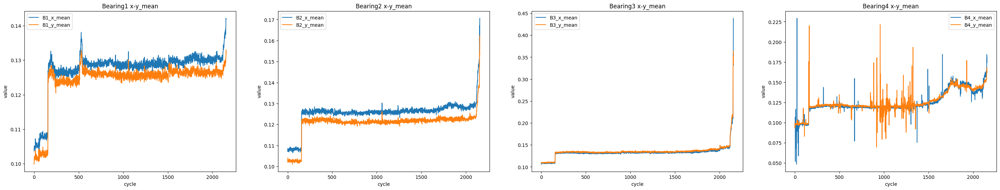

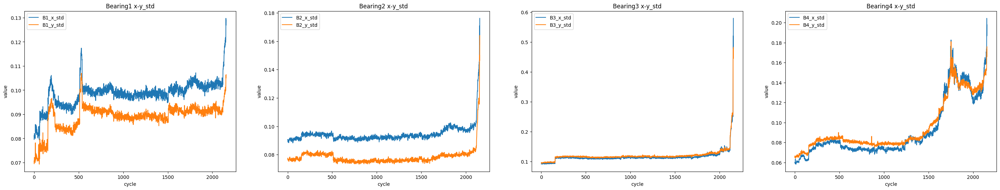

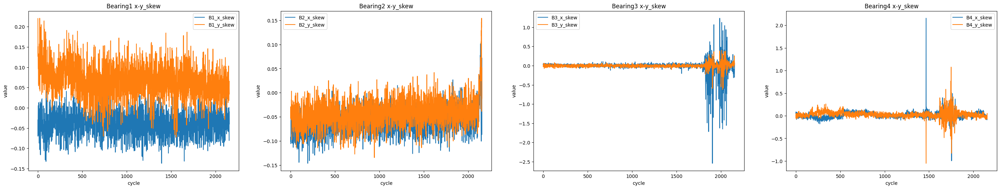

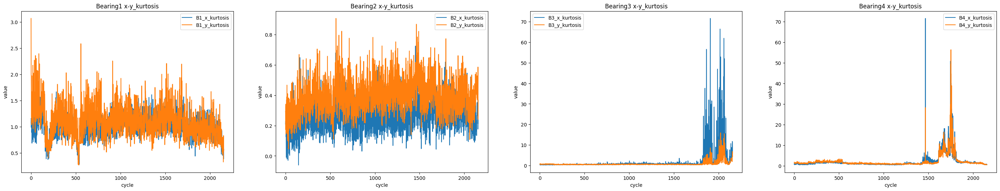

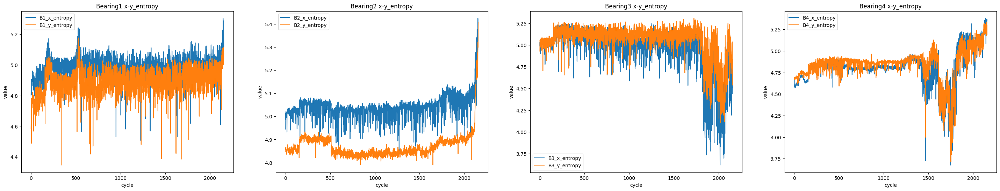

...

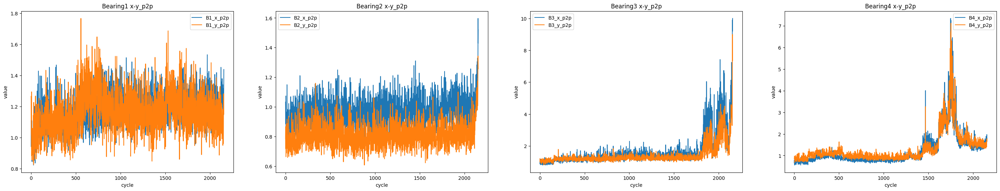

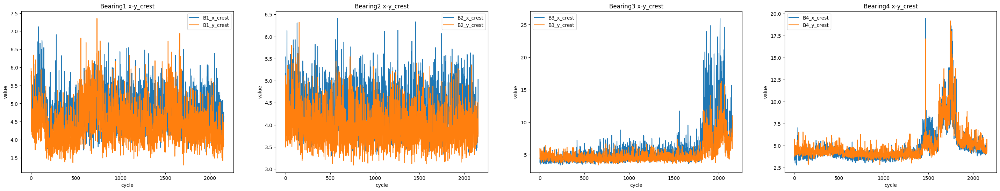

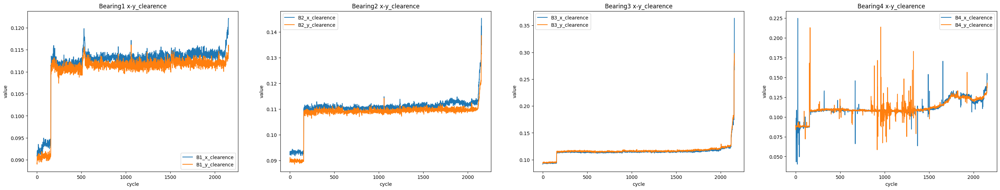

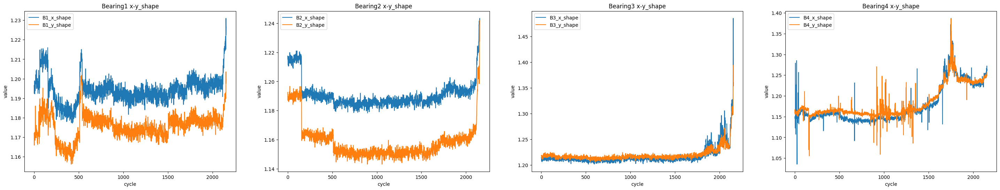

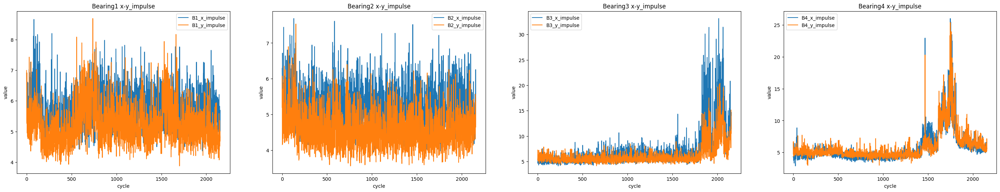

In [10]:
time_features_list = ["mean","std","skew","kurtosis","entropy","rms","max","p2p", "crest", "clearence", "shape", "impulse"]
bearings_xy = [["B"+str(n)+"_"+str(o)+"_" for n in range(1,5)] for o in ['x','y'] ] 
#print(bearings_xy)
for tf in time_features_list:
    fig = plt.figure()
    # Divide the figure into a 1x4 grid, and give me the first section
    ax1 = fig.add_subplot(141)
    # Divide the figure into a 1x4 grid, and give me the second section
    ax2 = fig.add_subplot(142)
    #...so on
    ax3 = fig.add_subplot(143)
    ax4 = fig.add_subplot(144)
    axes = [ax1,ax2,ax3, ax4]
    
    for i in range(4):
        col = bearings_xy[0][i]+tf
        set1[col].plot(figsize = (36,6), title="Bearing{} x-y_".format(i+1)+tf , legend = True, ax=axes[i])
        col = bearings_xy[1][i]+tf
        set1[col].plot(figsize = (36,6) , legend = True, ax=axes[i])
        axes[i].set(xlabel="cycle", ylabel="value")
        
    
    

In [129]:
# set1_hil= dataset.iloc[:,1]
# duration = 1
# fs = len(dataset)
# samples = int(fs*duration)
# t = np.arange(samples) / fs

In [24]:
# analytic_signal = hilbert(set1_hil)
# amplitude_envelope = np.abs(analytic_signal)
# instantaneous_phase = np.unwrap(np.angle(analytic_signal))
# instantaneous_frequency = (np.diff(instantaneous_phase) /
#                            (2.0*np.pi) * fs)

20479


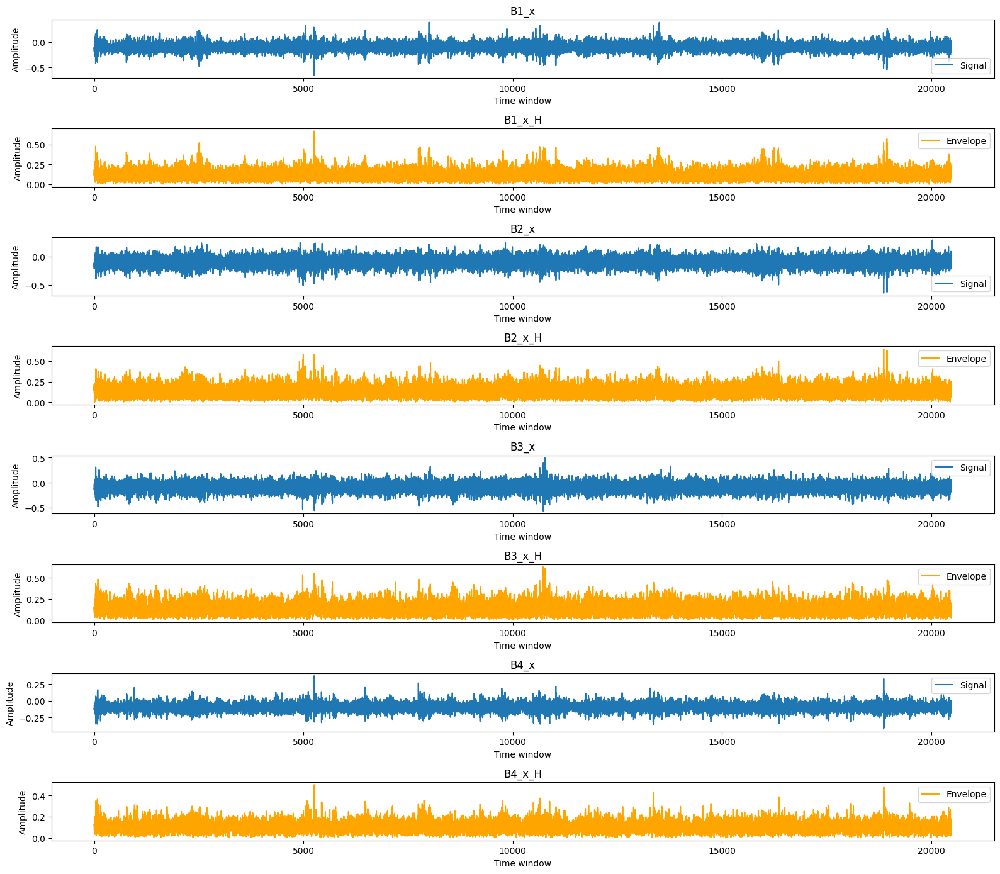

In [11]:
set1_pure= dataset.iloc[:,0]
h_signal_1 = np.abs(hilbert(set1_pure))
set2_pure= dataset.iloc[:,2]
h_signal_2 = np.abs(hilbert(set2_pure))
set3_pure= dataset.iloc[:,4]
h_signal_3 = np.abs(hilbert(set3_pure))
set4_pure= dataset.iloc[:,6]
h_signal_4 = np.abs(hilbert(set4_pure))
set5_pure= dataset.iloc[:,1]
h_signal_5 = np.abs(hilbert(set5_pure))
set6_pure= dataset.iloc[:,3]
h_signal_6 = np.abs(hilbert(set6_pure))
set7_pure= dataset.iloc[:,5]
h_signal_7 = np.abs(hilbert(set7_pure))
set8_pure= dataset.iloc[:,7]
h_signal_8 = np.abs(hilbert(set8_pure))


fig, (ax0, ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(figsize=(16, 14), nrows=8)
ax0.plot(set1_pure, label='Signal')
ax0.set_title("B1_x")
ax0.set_xlabel("Time window")
ax0.set_ylabel("Amplitude")
ax0.legend()
ax1.plot(h_signal_1, label='Envelope', color= 'orange')
ax1.set_title("B1_x_H")
ax1.set_xlabel("Time window")
ax1.set_ylabel("Amplitude")
ax1.legend()

ax2.plot(set2_pure, label='Signal')
ax2.set_title("B2_x")
ax2.set_xlabel("Time window")
ax2.set_ylabel("Amplitude")
ax2.legend()
ax3.plot(h_signal_2, label='Envelope', color= 'orange')
ax3.set_title("B2_x_H")
ax3.set_xlabel("Time window")
ax3.set_ylabel("Amplitude")
ax3.legend()

ax4.plot(set3_pure, label='Signal')
ax4.set_title("B3_x")
ax4.set_xlabel("Time window")
ax4.set_ylabel("Amplitude")
ax4.legend()
ax5.plot(h_signal_3, label='Envelope', color= 'orange')
ax5.set_title("B3_x_H")
ax5.set_xlabel("Time window")
ax5.set_ylabel("Amplitude")
ax5.legend()

ax6.plot(set4_pure, label='Signal')
ax6.set_title("B4_x")
ax6.set_xlabel("Time window")
ax6.set_ylabel("Amplitude")
ax6.legend()
ax7.plot(h_signal_4, label='Envelope', color= 'orange')
ax7.set_title("B4_x_H")
ax7.set_xlabel("Time window")
ax7.set_ylabel("Amplitude")
ax7.legend()

fig.tight_layout()

In [12]:
#sine information
set1_fft_r= np.fft.fft(h_signal_1).real
set2_fft_r= np.fft.fft(h_signal_2).real
set3_fft_r= np.fft.fft(h_signal_3).real
set4_fft_r= np.fft.fft(h_signal_4).real
set5_fft_r= np.fft.fft(h_signal_5).real
set6_fft_r= np.fft.fft(h_signal_6).real
set7_fft_r= np.fft.fft(h_signal_7).real
set8_fft_r= np.fft.fft(h_signal_8).real

#cosine information
set1_fft_i= np.fft.fft(h_signal_1).imag
set2_fft_i= np.fft.fft(h_signal_2).imag
set3_fft_i= np.fft.fft(h_signal_3).imag
set4_fft_i= np.fft.fft(h_signal_4).imag
set5_fft_i= np.fft.fft(h_signal_5).imag
set6_fft_i= np.fft.fft(h_signal_6).imag
set7_fft_i= np.fft.fft(h_signal_7).imag
set8_fft_i= np.fft.fft(h_signal_8).imag

#magnitude
set1_fft= np.abs(np.fft.fft(h_signal_1) /len (h_signal_1))
set2_fft= np.abs(np.fft.fft(h_signal_2) /len (h_signal_2))
set3_fft= np.abs(np.fft.fft(h_signal_3) /len (h_signal_3))
set4_fft= np.abs(np.fft.fft(h_signal_4) /len (h_signal_4))
set5_fft= np.abs(np.fft.fft(h_signal_5) /len (h_signal_5))
set6_fft= np.abs(np.fft.fft(h_signal_6) /len (h_signal_6))
set7_fft= np.abs(np.fft.fft(h_signal_7) /len (h_signal_7))
set8_fft= np.abs(np.fft.fft(h_signal_8) /len (h_signal_8))

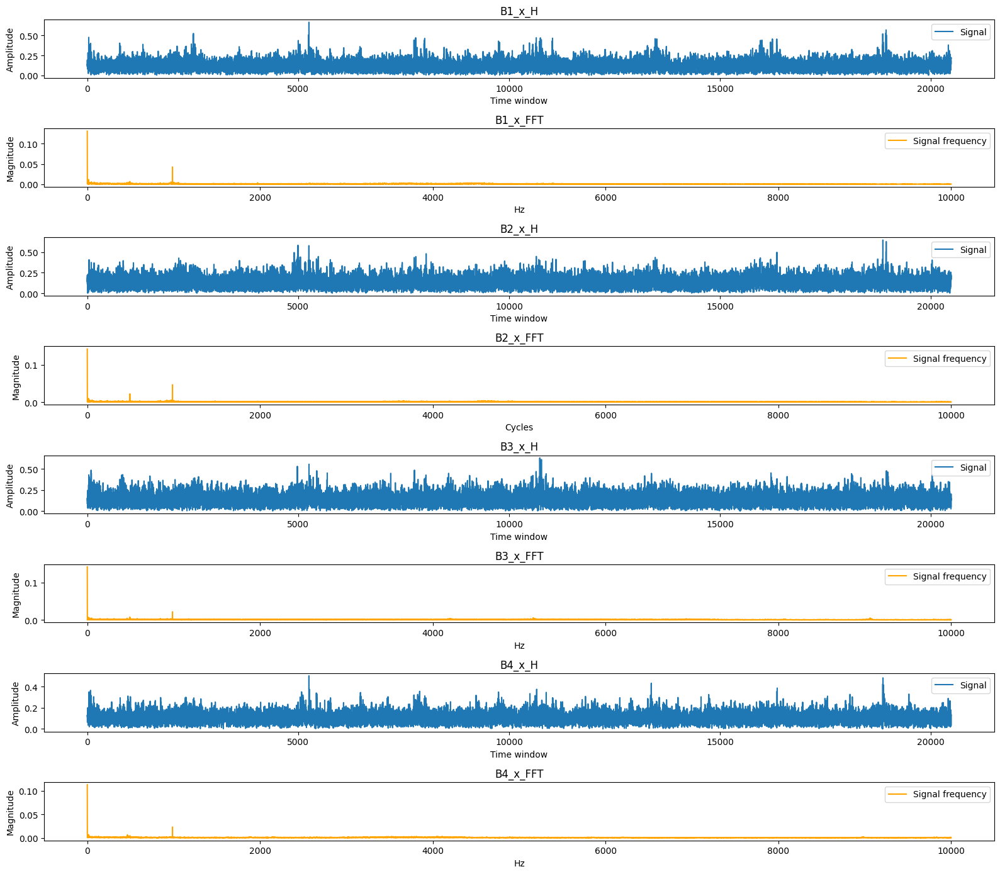

In [13]:
N = len(set1_fft)

#From the specs of Kaggle NASA dataset
Fsamp = 20000

Ts = 1/Fsamp

# timestep = 10
# freq = np.fft.fftfreq(N, d=timestep)

t= np.linspace(0, (N-1)*Ts, N)
Fs= Fsamp/ N
f= np.linspace(0, (N-1)*Fs, N)

f_plot= f[0:int(N/2+1)]
set1_fft_mag= 2 * set1_fft [0:int(N/2+1)]
set1_fft_mag[0]= set1_fft_mag[0] / 2
set2_fft_mag= 2 * set2_fft [0:int(N/2+1)]
set2_fft_mag[0]= set2_fft_mag[0] / 2
set3_fft_mag= 2 * set3_fft [0:int(N/2+1)]
set3_fft_mag[0]= set3_fft_mag[0] / 2
set4_fft_mag= 2 * set4_fft [0:int(N/2+1)]
set4_fft_mag[0]= set4_fft_mag[0] / 2
set5_fft_mag= 2 * set5_fft [0:int(N/2+1)]
set5_fft_mag[0]= set5_fft_mag[0] / 2
set6_fft_mag= 2 * set6_fft [0:int(N/2+1)]
set6_fft_mag[0]= set6_fft_mag[0] / 2
set7_fft_mag= 2 * set7_fft [0:int(N/2+1)]
set7_fft_mag[0]= set7_fft_mag[0] / 2
set8_fft_mag= 2 * set8_fft [0:int(N/2+1)]
set8_fft_mag[0]= set8_fft_mag[0] / 2

fig, (ax0, ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(figsize=(16, 14), nrows=8)
ax0.plot(h_signal_1, label='Signal')
ax0.set_title("B1_x_H")
ax0.set_xlabel("Time window")
ax0.set_ylabel("Amplitude")
ax0.legend()
ax1.plot(f_plot, set1_fft_mag, label='Signal frequency', color= 'orange')
ax1.set_title("B1_x_FFT")
ax1.set_xlabel("Hz")
ax1.set_ylabel("Magnitude")
ax1.legend()

ax2.plot(h_signal_2, label='Signal')
ax2.set_title("B2_x_H")
ax2.set_xlabel("Time window")
ax2.set_ylabel("Amplitude")
ax2.legend()
ax3.plot(f_plot, set2_fft_mag, label='Signal frequency', color= 'orange')
ax3.set_title("B2_x_FFT")
ax3.set_xlabel("Cycles")
ax3.set_ylabel("Magnitude")
ax3.legend()

ax4.plot(h_signal_3, label='Signal')
ax4.set_title("B3_x_H")
ax4.set_xlabel("Time window")
ax4.set_ylabel("Amplitude")
ax4.legend()
ax5.plot(f_plot, set3_fft_mag, label='Signal frequency', color= 'orange')
ax5.set_title("B3_x_FFT")
ax5.set_xlabel("Hz")
ax5.set_ylabel("Magnitude")
ax5.legend()

ax6.plot(h_signal_4, label='Signal')
ax6.set_title("B4_x_H")
ax6.set_xlabel("Time window")
ax6.set_ylabel("Amplitude")
ax6.legend()
ax7.plot(f_plot, set4_fft_mag, label='Signal frequency', color= 'orange')
ax7.set_title("B4_x_FFT")
ax7.set_xlabel("Hz")
ax7.set_ylabel("Magnitude")
ax7.legend()

#fig.suptitle('Magnitude FFT X Good')
fig.tight_layout()

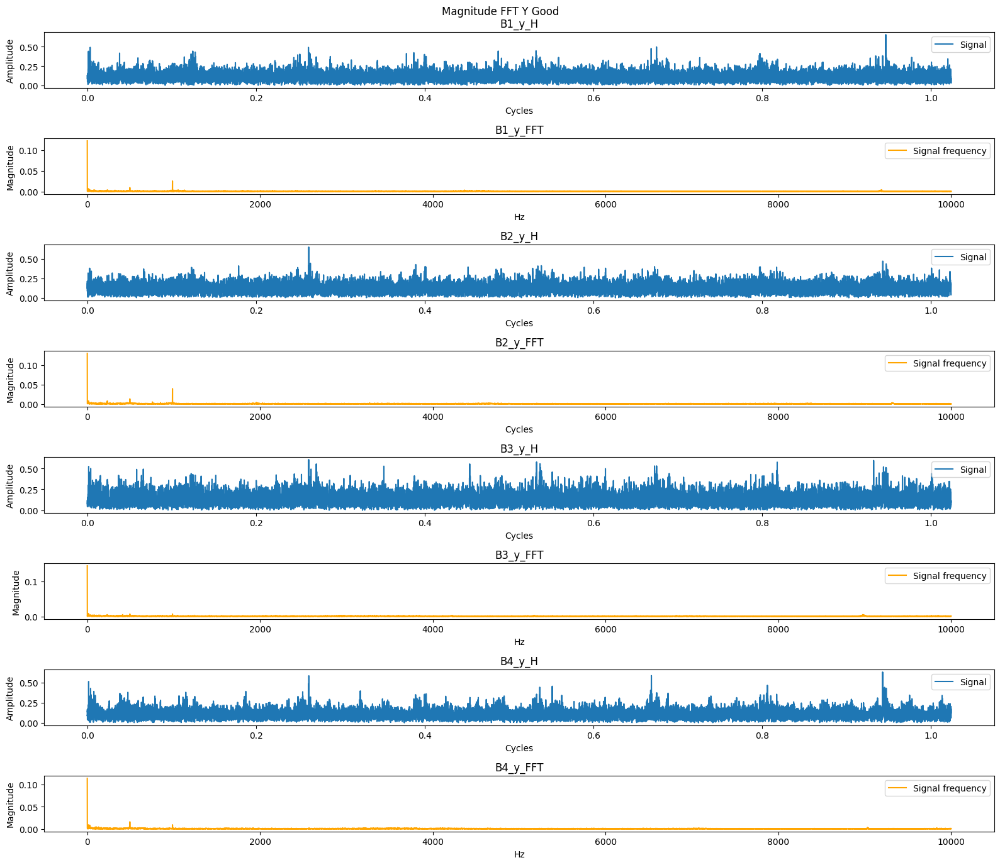

In [7]:
fig, (ax0, ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(figsize=(16, 14), nrows=8)
ax0.plot(t, h_signal_5, label='Signal')
ax0.set_title("B1_y_H")
ax0.set_xlabel("Cycles")
ax0.set_ylabel("Amplitude")
ax0.legend()
ax1.plot(f_plot, set5_fft_mag, label='Signal frequency', color= 'orange')
ax1.set_title("B1_y_FFT")
ax1.set_xlabel("Hz")
ax1.set_ylabel("Magnitude")
ax1.legend()

ax2.plot(t, h_signal_6, label='Signal')
ax2.set_title("B2_y_H")
ax2.set_xlabel("Cycles")
ax2.set_ylabel("Amplitude")
ax2.legend()
ax3.plot(f_plot, set6_fft_mag, label='Signal frequency', color= 'orange')
ax3.set_title("B2_y_FFT")
ax3.set_xlabel("Cycles")
ax3.set_ylabel("Magnitude")
ax3.legend()

ax4.plot(t, h_signal_7, label='Signal')
ax4.set_title("B3_y_H")
ax4.set_xlabel("Cycles")
ax4.set_ylabel("Amplitude")
ax4.legend()
ax5.plot(f_plot, set7_fft_mag, label='Signal frequency', color= 'orange')
ax5.set_title("B3_y_FFT")
ax5.set_xlabel("Hz")
ax5.set_ylabel("Magnitude")
ax5.legend()

ax6.plot(t, h_signal_8, label='Signal')
ax6.set_title("B4_y_H")
ax6.set_xlabel("Cycles")
ax6.set_ylabel("Amplitude")
ax6.legend()
ax7.plot(f_plot, set8_fft_mag, label='Signal frequency', color= 'orange')
ax7.set_title("B4_y_FFT")
ax7.set_xlabel("Hz")
ax7.set_ylabel("Magnitude")
ax7.legend()

fig.suptitle('Magnitude FFT Y Good')
fig.tight_layout()

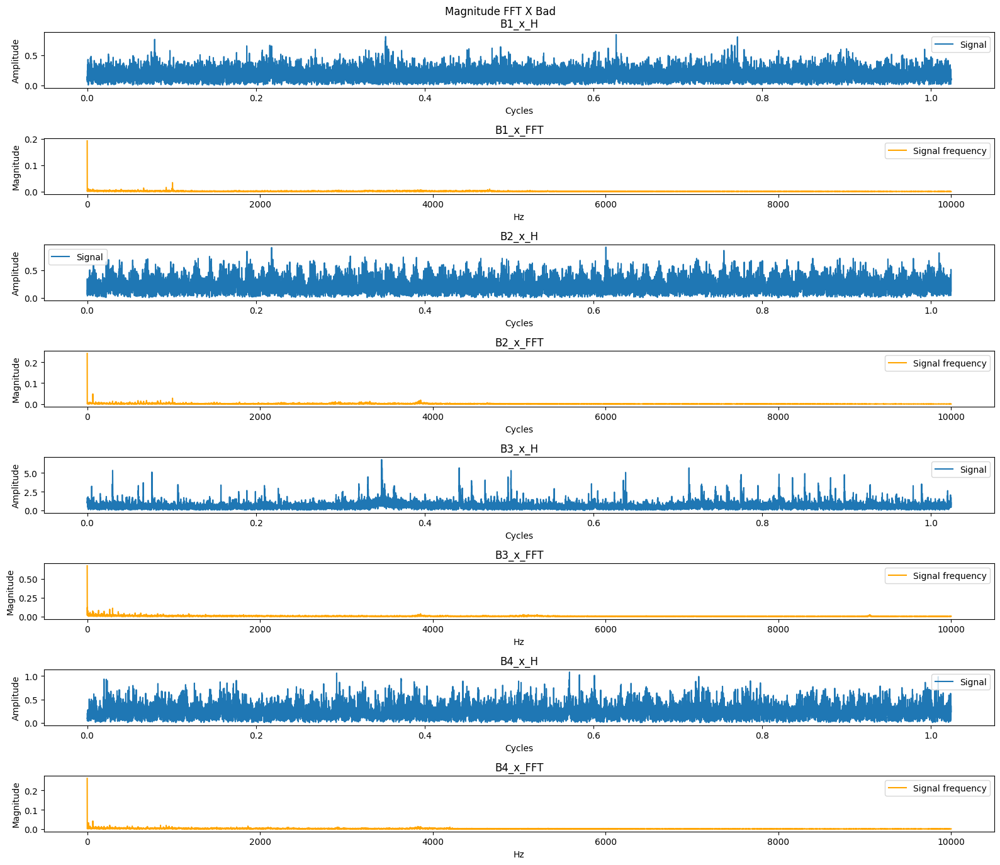

In [14]:
N = len(set1_fft)

#From the specs of Kaggle NASA dataset
Fsamp = 20000

Ts = 1/Fsamp

# timestep = 10
# freq = np.fft.fftfreq(N, d=timestep)

t= np.linspace(0, (N-1)*Ts, N)
Fs= Fsamp/ N
f= np.linspace(0, (N-1)*Fs, N)

f_plot= f[0:int(N/2+1)]
set1_fft_mag= 2 * set1_fft [0:int(N/2+1)]
set1_fft_mag[0]= set1_fft_mag[0] / 2
set2_fft_mag= 2 * set2_fft [0:int(N/2+1)]
set2_fft_mag[0]= set2_fft_mag[0] / 2
set3_fft_mag= 2 * set3_fft [0:int(N/2+1)]
set3_fft_mag[0]= set3_fft_mag[0] / 2
set4_fft_mag= 2 * set4_fft [0:int(N/2+1)]
set4_fft_mag[0]= set4_fft_mag[0] / 2
set5_fft_mag= 2 * set5_fft [0:int(N/2+1)]
set5_fft_mag[0]= set5_fft_mag[0] / 2
set6_fft_mag= 2 * set6_fft [0:int(N/2+1)]
set6_fft_mag[0]= set6_fft_mag[0] / 2
set7_fft_mag= 2 * set7_fft [0:int(N/2+1)]
set7_fft_mag[0]= set7_fft_mag[0] / 2
set8_fft_mag= 2 * set8_fft [0:int(N/2+1)]
set8_fft_mag[0]= set8_fft_mag[0] / 2

fig, (ax0, ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(figsize=(16, 14), nrows=8)
ax0.plot(t, h_signal_1, label='Signal')
ax0.set_title("B1_x_H")
ax0.set_xlabel("Cycles")
ax0.set_ylabel("Amplitude")
ax0.legend()
ax1.plot(f_plot, set1_fft_mag, label='Signal frequency', color= 'orange')
ax1.set_title("B1_x_FFT")
ax1.set_xlabel("Hz")
ax1.set_ylabel("Magnitude")
ax1.legend()

ax2.plot(t, h_signal_2, label='Signal')
ax2.set_title("B2_x_H")
ax2.set_xlabel("Cycles")
ax2.set_ylabel("Amplitude")
ax2.legend()
ax3.plot(f_plot, set2_fft_mag, label='Signal frequency', color= 'orange')
ax3.set_title("B2_x_FFT")
ax3.set_xlabel("Cycles")
ax3.set_ylabel("Magnitude")
ax3.legend()

ax4.plot(t, h_signal_3, label='Signal')
ax4.set_title("B3_x_H")
ax4.set_xlabel("Cycles")
ax4.set_ylabel("Amplitude")
ax4.legend()
ax5.plot(f_plot, set3_fft_mag, label='Signal frequency', color= 'orange')
ax5.set_title("B3_x_FFT")
ax5.set_xlabel("Hz")
ax5.set_ylabel("Magnitude")
ax5.legend()

ax6.plot(t, h_signal_4, label='Signal')
ax6.set_title("B4_x_H")
ax6.set_xlabel("Cycles")
ax6.set_ylabel("Amplitude")
ax6.legend()
ax7.plot(f_plot, set4_fft_mag, label='Signal frequency', color= 'orange')
ax7.set_title("B4_x_FFT")
ax7.set_xlabel("Hz")
ax7.set_ylabel("Magnitude")
ax7.legend()

fig.suptitle('Magnitude FFT X Bad')
fig.tight_layout()

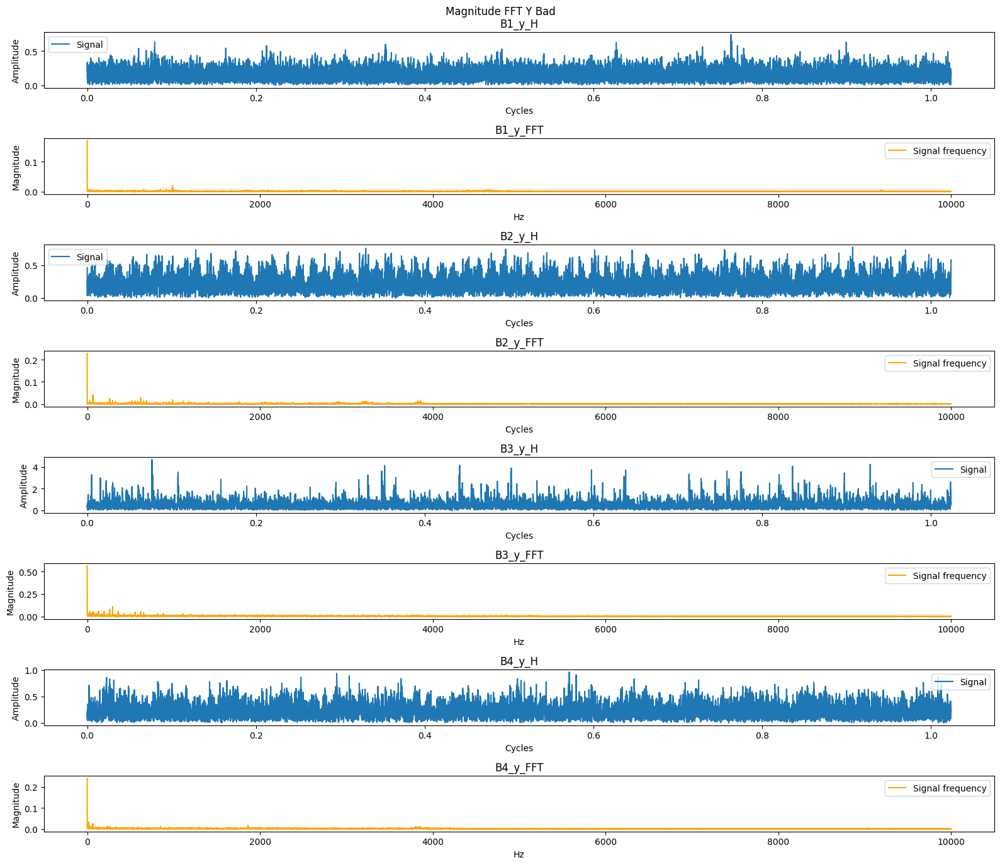

In [13]:
fig, (ax0, ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(figsize=(16, 14), nrows=8)
ax0.plot(t, h_signal_5, label='Signal')
ax0.set_title("B1_y_H")
ax0.set_xlabel("Cycles")
ax0.set_ylabel("Amplitude")
ax0.legend()
ax1.plot(f_plot, set5_fft_mag, label='Signal frequency', color= 'orange')
ax1.set_title("B1_y_FFT")
ax1.set_xlabel("Hz")
ax1.set_ylabel("Magnitude")
ax1.legend()

ax2.plot(t, h_signal_6, label='Signal')
ax2.set_title("B2_y_H")
ax2.set_xlabel("Cycles")
ax2.set_ylabel("Amplitude")
ax2.legend()
ax3.plot(f_plot, set6_fft_mag, label='Signal frequency', color= 'orange')
ax3.set_title("B2_y_FFT")
ax3.set_xlabel("Cycles")
ax3.set_ylabel("Magnitude")
ax3.legend()

ax4.plot(t, h_signal_7, label='Signal')
ax4.set_title("B3_y_H")
ax4.set_xlabel("Cycles")
ax4.set_ylabel("Amplitude")
ax4.legend()
ax5.plot(f_plot, set7_fft_mag, label='Signal frequency', color= 'orange')
ax5.set_title("B3_y_FFT")
ax5.set_xlabel("Hz")
ax5.set_ylabel("Magnitude")
ax5.legend()

ax6.plot(t, h_signal_8, label='Signal')
ax6.set_title("B4_y_H")
ax6.set_xlabel("Cycles")
ax6.set_ylabel("Amplitude")
ax6.legend()
ax7.plot(f_plot, set8_fft_mag, label='Signal frequency', color= 'orange')
ax7.set_title("B4_y_FFT")
ax7.set_xlabel("Hz")
ax7.set_ylabel("Magnitude")
ax7.legend()

fig.suptitle('Magnitude FFT Y Bad')
fig.tight_layout()

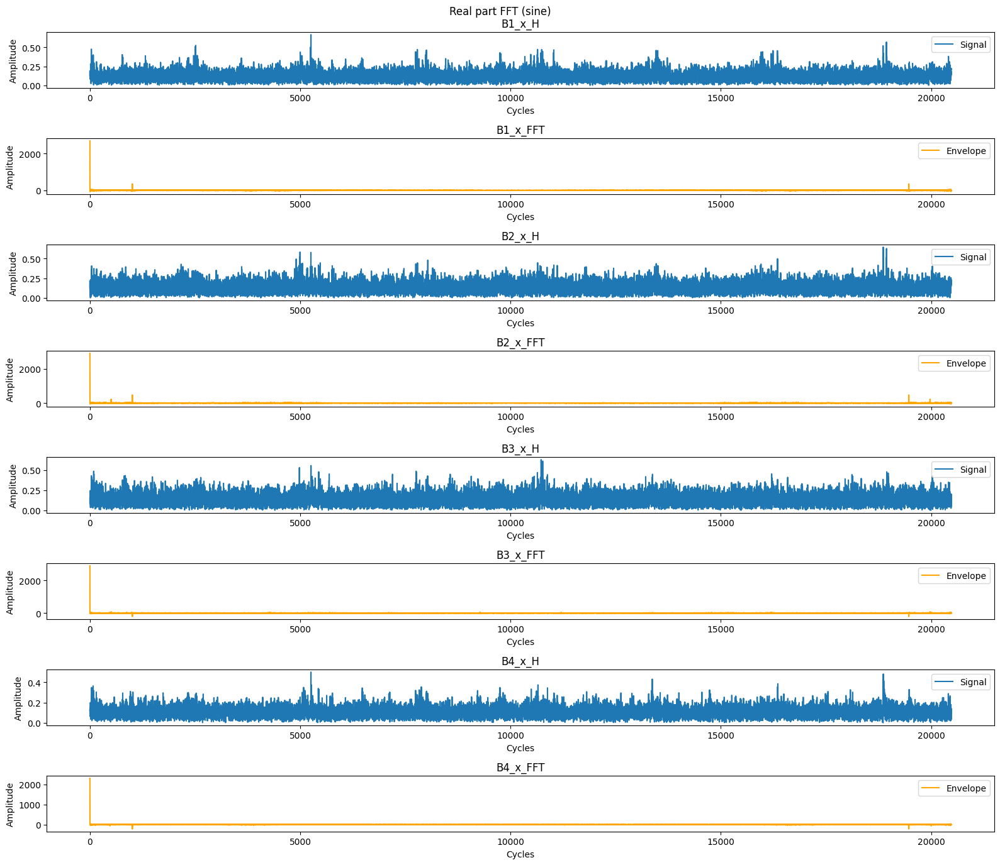

In [13]:
fig, (ax0, ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(figsize=(16, 14), nrows=8)
ax0.plot(h_signal_1, label='Signal')
ax0.set_title("B1_x_H")
ax0.set_xlabel("Cycles")
ax0.set_ylabel("Amplitude")
ax0.legend()
ax1.plot(set1_fft_r, label='Envelope', color= 'orange')
ax1.set_title("B1_x_FFT")
ax1.set_xlabel("Cycles")
ax1.set_ylabel("Amplitude")
ax1.legend()

ax2.plot(h_signal_2, label='Signal')
ax2.set_title("B2_x_H")
ax2.set_xlabel("Cycles")
ax2.set_ylabel("Amplitude")
ax2.legend()
ax3.plot(set2_fft_r, label='Envelope', color= 'orange')
ax3.set_title("B2_x_FFT")
ax3.set_xlabel("Cycles")
ax3.set_ylabel("Amplitude")
ax3.legend()

ax4.plot(h_signal_3, label='Signal')
ax4.set_title("B3_x_H")
ax4.set_xlabel("Cycles")
ax4.set_ylabel("Amplitude")
ax4.legend()
ax5.plot(set3_fft_r, label='Envelope', color= 'orange')
ax5.set_title("B3_x_FFT")
ax5.set_xlabel("Cycles")
ax5.set_ylabel("Amplitude")
ax5.legend()

ax6.plot(h_signal_4, label='Signal')
ax6.set_title("B4_x_H")
ax6.set_xlabel("Cycles")
ax6.set_ylabel("Amplitude")
ax6.legend()
ax7.plot(set4_fft_r, label='Envelope', color= 'orange')
ax7.set_title("B4_x_FFT")
ax7.set_xlabel("Cycles")
ax7.set_ylabel("Amplitude")
ax7.legend()

fig.suptitle('Real part FFT (sine)')
fig.tight_layout()

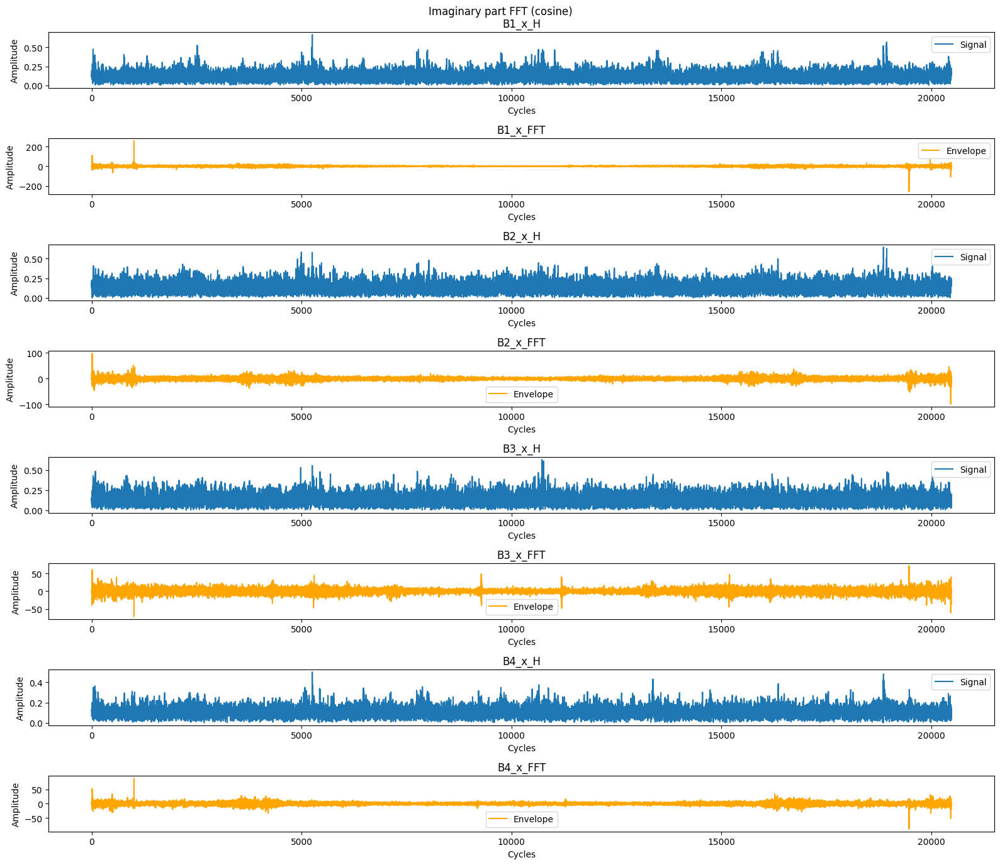

In [45]:
fig, (ax0, ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(figsize=(16, 14), nrows=8)
ax0.plot(h_signal_1, label='Signal')
ax0.set_title("B1_x_H")
ax0.set_xlabel("Cycles")
ax0.set_ylabel("Amplitude")
ax0.legend()
ax1.plot(set1_fft_i, label='Envelope', color= 'orange')
ax1.set_title("B1_x_FFT")
ax1.set_xlabel("Cycles")
ax1.set_ylabel("Amplitude")
ax1.legend()

ax2.plot(h_signal_2, label='Signal')
ax2.set_title("B2_x_H")
ax2.set_xlabel("Cycles")
ax2.set_ylabel("Amplitude")
ax2.legend()
ax3.plot(set2_fft_i, label='Envelope', color= 'orange')
ax3.set_title("B2_x_FFT")
ax3.set_xlabel("Cycles")
ax3.set_ylabel("Amplitude")
ax3.legend()

ax4.plot(h_signal_3, label='Signal')
ax4.set_title("B3_x_H")
ax4.set_xlabel("Cycles")
ax4.set_ylabel("Amplitude")
ax4.legend()
ax5.plot(set3_fft_i, label='Envelope', color= 'orange')
ax5.set_title("B3_x_FFT")
ax5.set_xlabel("Cycles")
ax5.set_ylabel("Amplitude")
ax5.legend()

ax6.plot(h_signal_4, label='Signal')
ax6.set_title("B4_x_H")
ax6.set_xlabel("Cycles")
ax6.set_ylabel("Amplitude")
ax6.legend()
ax7.plot(set4_fft_i, label='Envelope', color= 'orange')
ax7.set_title("B4_x_FFT")
ax7.set_xlabel("Cycles")
ax7.set_ylabel("Amplitude")
ax7.legend()

fig.suptitle('Imaginary part FFT (cosine)')
fig.tight_layout()

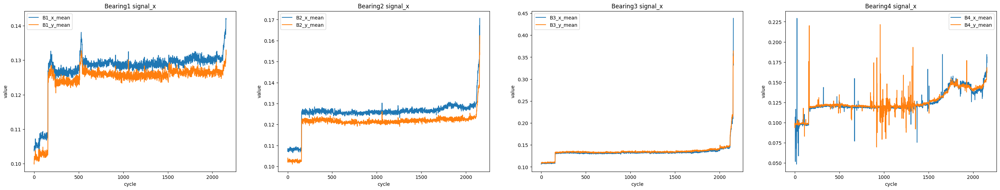

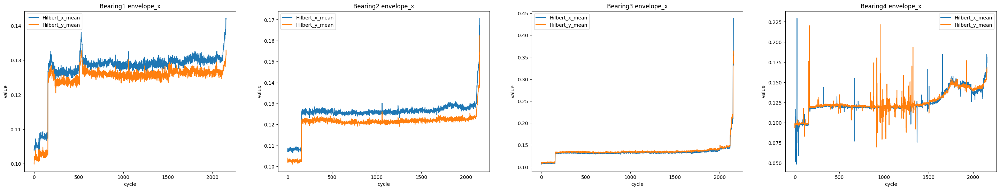

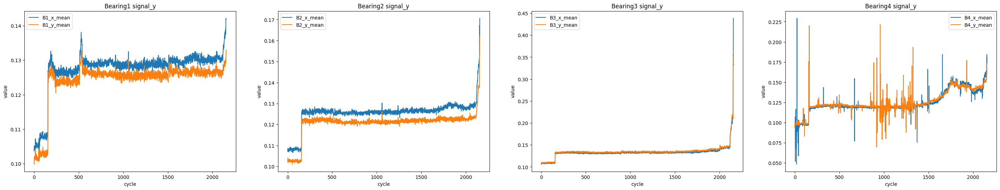

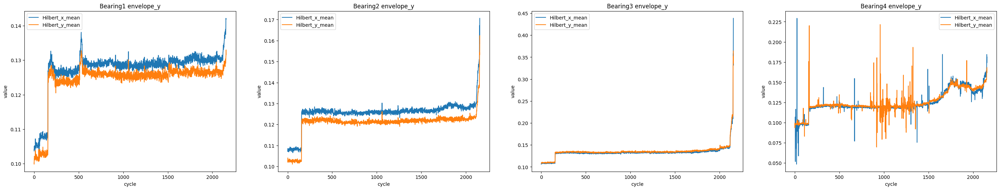

In [172]:
time_features_list = ["signal_x","envelope_x", "signal_y","envelope_y"]
bearings_xy = [["B"+str(n)+"_"+str(o)+"_" for n in range(1,5)] for o in ['x','y'] ] 
#print(bearings_xy)
for tf in time_features_list:
    fig = plt.figure()
    # Divide the figure into a 1x4 grid, and give me the first section
    ax1 = fig.add_subplot(141)
    # Divide the figure into a 1x4 grid, and give me the second section
    ax2 = fig.add_subplot(142)
    #...so on
    ax3 = fig.add_subplot(143)
    ax4 = fig.add_subplot(144)
    axes = [ax1,ax2,ax3, ax4]
    
    if (tf== "signal_x" or tf== "signal_y"):
        for i in range(4):
            col = bearings_xy[0][i]+"mean"
            set1[col].plot(figsize = (36,6), title="Bearing{} ".format(i+1)+tf , legend = True, ax=axes[i])
            col = bearings_xy[1][i]+"mean"
            set1[col].plot(figsize = (36,6) , legend = True, ax=axes[i])
            axes[i].set(xlabel="cycle", ylabel="value")
    else:
        for i in range(4):
            col = bearings_xy[0][i]+"mean"
            pd.DataFrame(hilbert(set1[col]).real, columns=['Hilbert_x_mean']).plot(figsize = (36,6), title="Bearing{} ".format(i+1)+tf , legend = True, ax=axes[i])
            col = bearings_xy[1][i]+"mean"
            pd.DataFrame(hilbert(set1[col]).real, columns=['Hilbert_y_mean']).plot(figsize = (36,6) , legend = True, ax=axes[i])
            axes[i].set(xlabel="cycle", ylabel="value") 

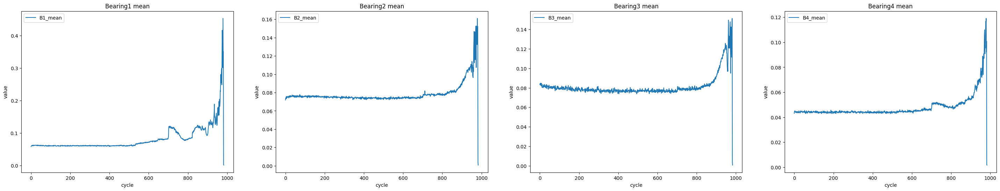

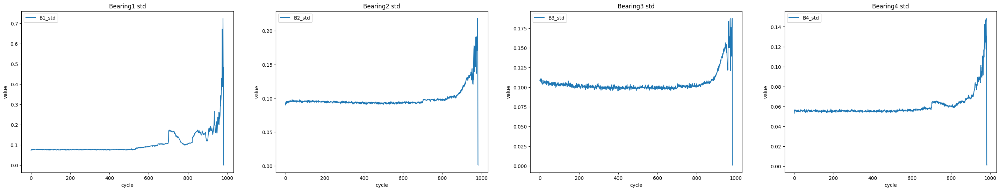

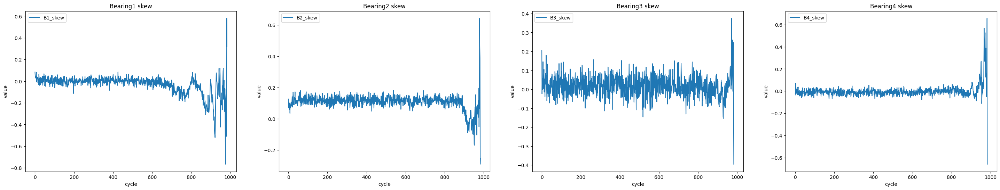

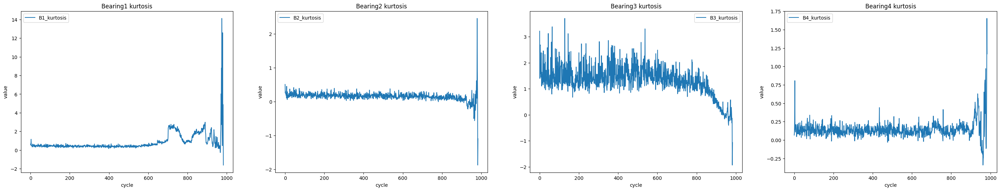

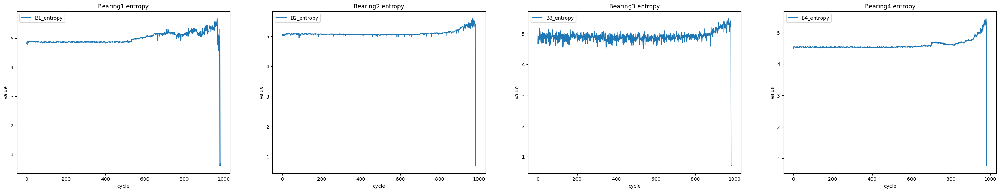

...

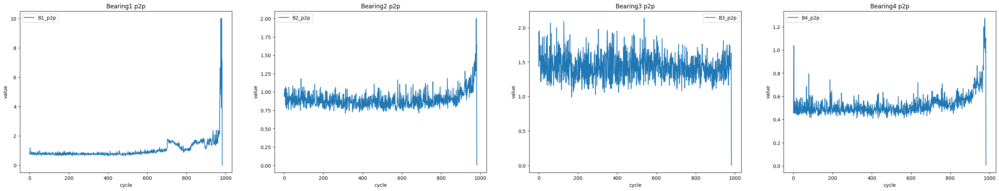

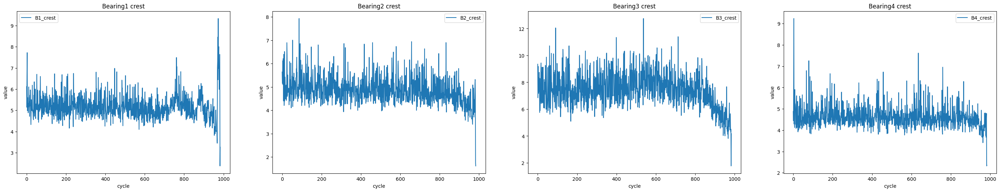

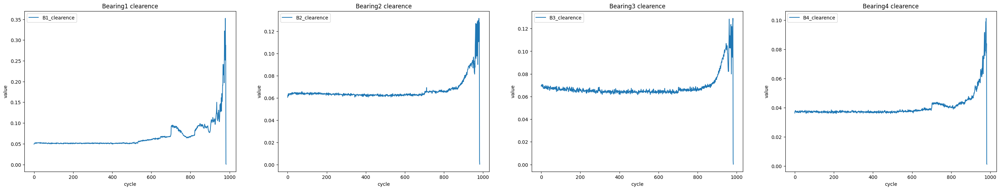

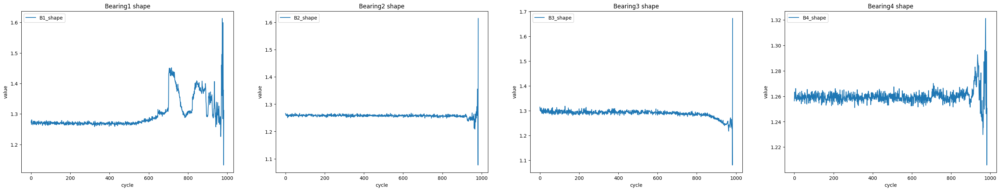

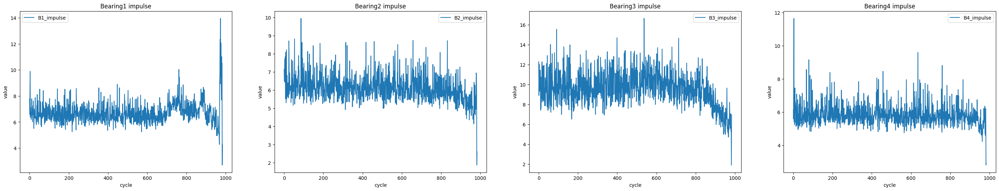

In [140]:
time_features_list = ["mean","std","skew","kurtosis","entropy","rms","max","p2p", "crest", "clearence", "shape", "impulse"]
bearings_xy = [["B"+str(n)+"_" for n in range(1,5)]] 
#print(bearings_xy)
for tf in time_features_list:
    fig = plt.figure()
    # Divide the figure into a 1x4 grid, and give me the first section
    ax1 = fig.add_subplot(141)
    # Divide the figure into a 1x4 grid, and give me the second section
    ax2 = fig.add_subplot(142)
    #...so on
    ax3 = fig.add_subplot(143)
    ax4 = fig.add_subplot(144)
    axes = [ax1,ax2,ax3, ax4]
    
    for i in range(4):
        col = bearings_xy[0][i]+tf
        set2[col].plot(figsize = (36,6), title="Bearing{} ".format(i+1)+tf , legend = True, ax=axes[i])
#        col = bearings_xy[1][i]+tf
#        set2[col].plot(figsize = (36,6) , legend = True, ax=axes[i])
        axes[i].set(xlabel="cycle", ylabel="value")

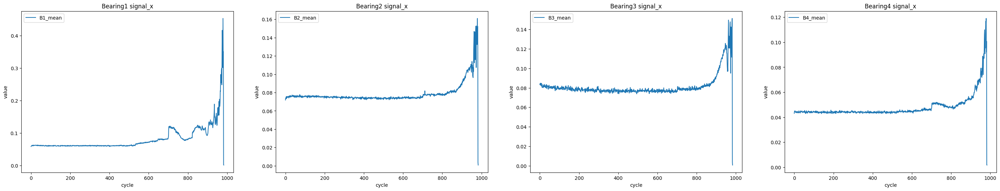

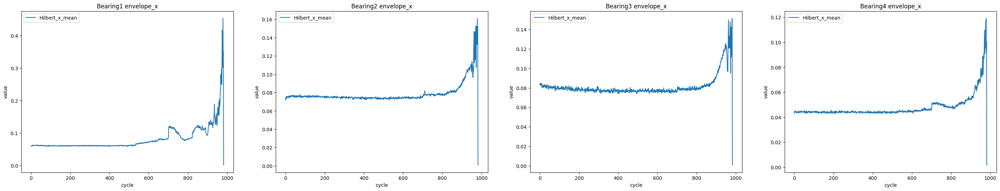

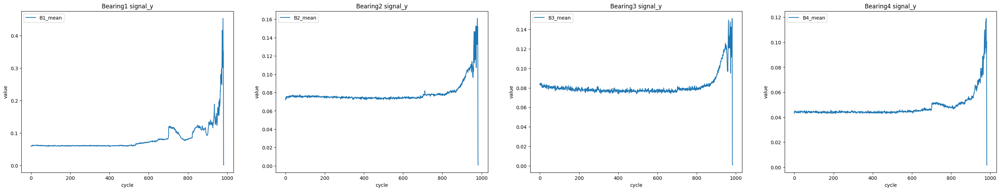

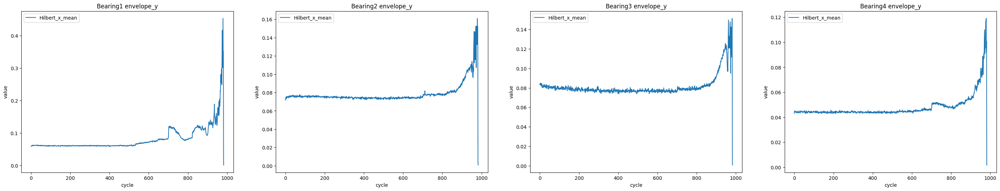

In [177]:
time_features_list = ["signal_x","envelope_x", "signal_y","envelope_y"]
bearings_xy = [["B"+str(n)+"_" for n in range(1,5)]] 
#print(bearings_xy)
for tf in time_features_list:
    fig = plt.figure()
    # Divide the figure into a 1x4 grid, and give me the first section
    ax1 = fig.add_subplot(141)
    # Divide the figure into a 1x4 grid, and give me the second section
    ax2 = fig.add_subplot(142)
    #...so on
    ax3 = fig.add_subplot(143)
    ax4 = fig.add_subplot(144)
    axes = [ax1,ax2,ax3, ax4]
    
    if (tf== "signal_x" or tf== "signal_y"):
        for i in range(4):
            col = bearings_xy[0][i]+"mean"
            set2[col].plot(figsize = (36,6), title="Bearing{} ".format(i+1)+tf , legend = True, ax=axes[i])
            axes[i].set(xlabel="cycle", ylabel="value")
    else:
        for i in range(4):
            col = bearings_xy[0][i]+"mean"
            pd.DataFrame(hilbert(set2[col]).real, columns=['Hilbert_x_mean']).plot(figsize = (36,6), title="Bearing{} ".format(i+1)+tf , legend = True, ax=axes[i])
            axes[i].set(xlabel="cycle", ylabel="value") 

# Unsupervised

In [7]:
import keras
from matplotlib import pyplot as plt
import numpy as np
import gzip
%matplotlib inline
import tensorflow as tf
from keras.models import Model
from keras.optimizers import RMSprop
from keras.layers import Input,Dense,Flatten,Dropout,Reshape,Conv1D,MaxPooling1D,UpSampling1D,Conv1DTranspose,BatchNormalization,Lambda
from keras.models import Model,Sequential
from keras.callbacks import ModelCheckpoint
from keras.optimizers import Adadelta, RMSprop,SGD,Adam
from keras import regularizers
from keras import backend as K
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

In [2]:
label_dict = {
 0: 'Low',
 1: 'Medium',
 2: 'High',
}

In [146]:
batch_size = 64
epochs = 200
inChannel = 1
x = len(set1_fft)

train_data = set1_fft.reshape(-1, 1)
test_data = set2_fft.reshape(-1, 1)

train_X,valid_X,train_ground,valid_ground = train_test_split(train_data,
                                                             train_data,
                                                             test_size=0.2)

input_sig = Input(shape = (x, inChannel))
print (input_sig)
num_classes = 3

KerasTensor(type_spec=TensorSpec(shape=(None, 20479, 1), dtype=tf.float32, name='input_21'), name='input_21', description="created by layer 'input_21'")


In [132]:
def classifier_func(x):
    return x+x*K.one_hot(K.argmax(x, axis=1), num_classes= num_classes)

In [147]:
def encoder(input_sig, num_classes):

    #encoder
    #input = 28 x 28 x 1 (wide and thin)
    #print(tf.shape(input_sig))
    conv1 = Conv1D(32, (3), activation='relu', padding='same',input_shape=(20479, 1))(input_sig) #28 x 28 x 32
    conv1 = BatchNormalization()(conv1)
    conv1 = Conv1D(32, (3), activation='relu', padding='same')(conv1)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling1D(pool_size=(2), padding= 'same')(conv1) #14 x 14 x 32
    conv2 = Conv1D(64, (3), activation='relu', padding='same')(pool1) #14 x 14 x 64
    conv2 = BatchNormalization()(conv2)
    conv2 = Conv1D(64, (3), activation='relu', padding='same')(conv2)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling1D(pool_size= (2), padding='same')(conv2) #7 x 7 x 64
    conv3 = Conv1D(128, (3), activation='relu', padding='same')(pool2) #7 x 7 x 128 (small and thick)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv1D(128, (3), activation='relu', padding='same')(conv3)
    conv3 = BatchNormalization()(conv3)
    conv4 = Conv1D(256, (3), activation='relu', padding='same')(conv3) #7 x 7 x 256 (small and thick)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv1D(256, (3), activation='relu', padding='same')(conv4)
    conv4 = BatchNormalization()(conv4)
    den = Dense(128, activation='relu')(conv4)
    out = Dense(num_classes, activation='softmax')(den)
    return out

def decoder(out):    
    #decoder
    conv5 = Conv1D(128, (3), activation='relu', padding='same')(out) #7 x 7 x 128
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv1D(128, (3), activation='relu', padding='same')(conv5)
    conv5 = BatchNormalization()(conv5)
    conv6 = Conv1D(64, (3), activation='relu', padding='same')(conv5) #7 x 7 x 64
    conv6 = BatchNormalization()(conv6)
    conv6 = Conv1D(64, (3), activation='relu', padding='same')(conv6)
    conv6 = BatchNormalization()(conv6)
    up1 = UpSampling1D((2))(conv6) #14 x 14 x 64
    conv7 = Conv1D(32, (3), activation='relu', padding='same')(up1) # 14 x 14 x 32
    conv7 = BatchNormalization()(conv7)
    conv7 = Conv1D(32, (3), activation='relu', padding='same')(conv7)
    conv7 = BatchNormalization()(conv7)
    up2 = UpSampling1D((2))(conv7) # 28 x 28 x 32
    decoded = Conv1D(1, (3), activation='sigmoid', padding='same')(up2) # 28 x 28 x 1
    return decoded

In [148]:
autoencoder = Model(input_sig, decoder(encoder(input_sig, num_classes)))
autoencoder.compile(loss='mean_squared_error', optimizer = RMSprop())

In [149]:
autoencoder.summary()
autoencoder_train = autoencoder.fit(train_X, train_ground, batch_size=batch_size,epochs=epochs,verbose=1,validation_data=(valid_X, valid_ground))

Model: "model_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(None, 20479, 1)]        0         
                                                                 
 conv1d_499 (Conv1D)         (None, 20479, 32)         128       
                                                                 
 batch_normalization_468 (Ba  (None, 20479, 32)        128       
 tchNormalization)                                               
                                                                 
 conv1d_500 (Conv1D)         (None, 20479, 32)         3104      
                                                                 
 batch_normalization_469 (Ba  (None, 20479, 32)        128       
 tchNormalization)                                               
                                                                 
 max_pooling1d_78 (MaxPoolin  (None, 10240, 32)        0  

In [150]:
autoencoder.save_weights('models_autoencoder/autoencoder')

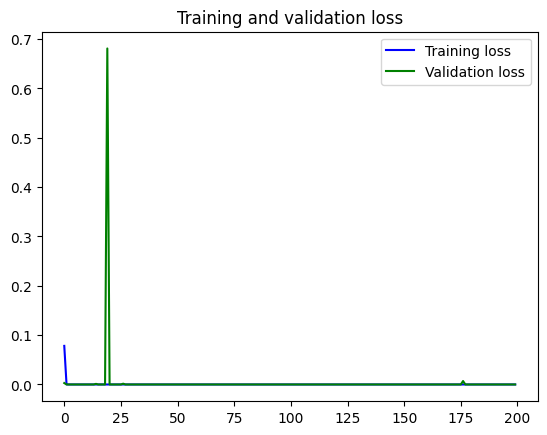

In [151]:
loss = autoencoder_train.history['loss']
val_loss = autoencoder_train.history['val_loss']
epochs = range(200)
plt.figure()
plt.plot(epochs, loss, label='Training loss', color= "blue")
plt.plot(epochs, val_loss, label='Validation loss', color= "green")
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [ ]:
# # Change the labels from categorical to one-hot encoding
# train_Y_one_hot = to_categorical(train_labels)
# test_Y_one_hot = to_categorical(test_labels)

# # Display the change for category label using one-hot encoding
# print('Original label:', train_labels[0])
# print('After conversion to one-hot:', train_Y_one_hot[0])

In [110]:
# train_X,valid_X,train_label,valid_label = train_test_split(train_data,train_data,test_size=0.2,random_state=13)

In [111]:
# def fc(enco):
#     flat = Flatten()(enco)
#     den = Dense(128, activation='relu')(flat)
#     out = Dense(num_classes, activation='softmax')(den)
#     return out

In [152]:
encode = encoder(input_sig, num_classes)
full_model = Model(input_sig,encode)
full_model.summary()

Model: "model_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(None, 20479, 1)]        0         
                                                                 
 conv1d_514 (Conv1D)         (None, 20479, 32)         128       
                                                                 
 batch_normalization_482 (Ba  (None, 20479, 32)        128       
 tchNormalization)                                               
                                                                 
 conv1d_515 (Conv1D)         (None, 20479, 32)         3104      
                                                                 
 batch_normalization_483 (Ba  (None, 20479, 32)        128       
 tchNormalization)                                               
                                                                 
 max_pooling1d_80 (MaxPoolin  (None, 10240, 32)        0  

In [155]:
encode = full_model.predict(train_X)

print(label_dict)
    
neuron_class = np.zeros((num_classes))
for i in range(num_classes):
    neuron_class[i] = np.argmax(label_dict[i], axis=0)

print(neuron_class)

encode = full_model.predict(valid_X)

print (encode)

predicted = np.argmax(encode, axis=1)
for i, sample in enumerate(predicted):
    predicted[i] = neuron_class[predicted[i]]
print(neuron_class)

512/512 [==============================] - 2s 4ms/step
{0: 'Low', 1: 'Medium', 2: 'High'}
[0. 0. 0.]
128/128 [==============================] - 1s 4ms/step
[[[0.33333334 0.33333337 0.33333334]]

 [[0.33333334 0.33333337 0.33333334]]

 [[0.3333333  0.33333334 0.3333333 ]]

 ...

 [[0.33333334 0.33333337 0.33333334]]

 [[0.33333334 0.33333337 0.33333334]]

 [[0.3333333  0.33333334 0.3333333 ]]]
[0. 0. 0.]


# Supervised statistic

In [14]:
import scipy.stats as st
import statsmodels.stats.weightstats as stat

In [16]:
print (len(set1))

set_analytic_x= set1 [["B1_x_freq_band_1", "B1_x_freq_band_2", "B1_x_freq_band_3", "B1_x_freq_band_4", "B1_x_freq_band_5"]]
set_analytic_y= set1 [["B1_y_freq_band_1", "B1_x_freq_band_2", "B1_x_freq_band_3", "B1_x_freq_band_4", "B1_x_freq_band_5"]]

set1_good= set1 [["B1_x_freq_band_1", "B2_x_freq_band_2", "B1_x_freq_band_3", "B2_x_freq_band_4", "B1_x_freq_band_5"]]
set1_good= set1_good.iloc[0:36,:]

set1_middle1= set1 [["B1_x_freq_band_1", "B2_x_freq_band_2", "B1_x_freq_band_3", "B2_x_freq_band_4", "B1_x_freq_band_5"]]
set1_middle1= set1_middle1.iloc[36:72,:]

set1_middle2= set1 [["B1_x_freq_band_1", "B2_x_freq_band_2", "B1_x_freq_band_3", "B2_x_freq_band_4", "B1_x_freq_band_5"]]
set1_middle2= set1_middle2.iloc[2000:2036,:]

#print (set1_middle2)

set1_bad= set1 [["B1_x_freq_band_1", "B2_x_freq_band_2", "B1_x_freq_band_3", "B2_x_freq_band_4", "B1_x_freq_band_5"]]
set1_bad= set1_bad.iloc[-36:,:]

check_nan = set1_middle2.isnull().values.any()
 
# printing the result
print(check_nan)

#print (set1_bad)

2156
False


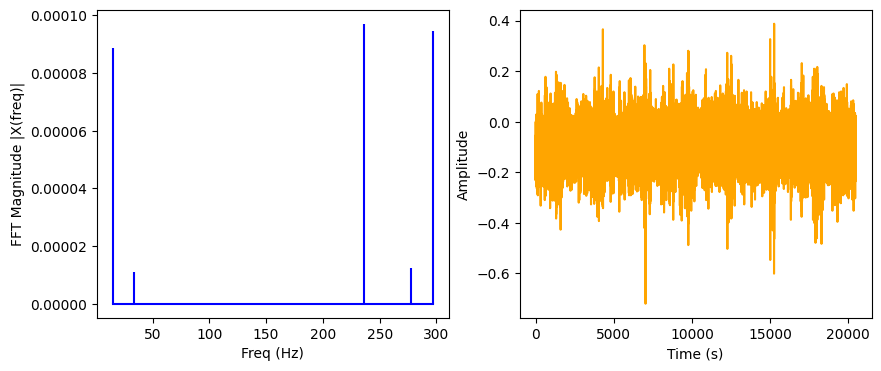

In [21]:
raw_data_g = pd.read_csv(os.path.join(dataset_path_1st, "2003.10.22.12.06.24"), sep='\t')

fft_x_g= set1_good.iloc[0:1,:].values
fft_x_g = np.squeeze(fft_x_g)

freq= [15, 34, 236, 278, 297]

ts = len(np.squeeze(raw_data_g.iloc[:,0:1].values))
t = np.arange(0,ts,1)

plt.figure(figsize = (10, 4))
plt.subplot(121)

plt.stem(freq, fft_x_g, 'b', markerfmt=" ", basefmt="-b")
plt.xlabel('Freq (Hz)')
plt.ylabel('FFT Magnitude |X(freq)|')
#plt.ylim(0, 0.0005)

plt.subplot(122)
plt.plot(t, np.squeeze(raw_data_g.iloc[:,0:1].values), 'orange')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
#plt.suptitle('Good bearing')
plt.show()

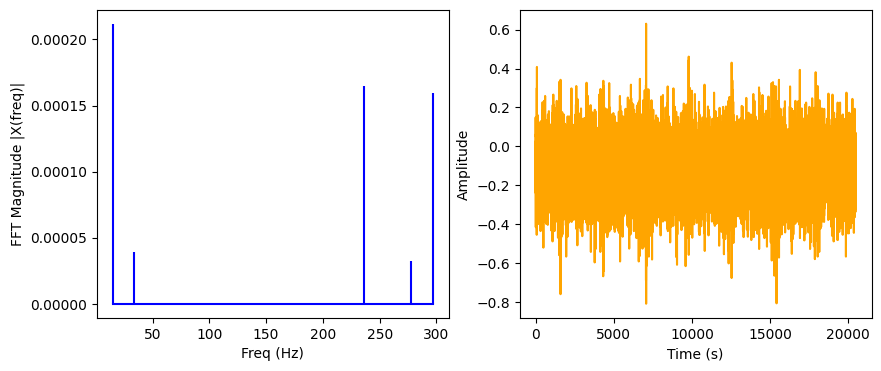

In [107]:
raw_data_b = pd.read_csv(os.path.join(dataset_path_1st, "2003.11.25.23.39.56"), sep='\t')

fft_x_b= set1_bad.iloc[-1:,:].values
fft_x_b = np.squeeze(fft_x_b)

freq= [15, 34, 236, 278, 297]

ts = len(np.squeeze(raw_data_b.iloc[:,0:1].values))
t = np.arange(0,ts,1)

plt.figure(figsize = (10, 4))
plt.subplot(121)

plt.stem(freq, fft_x_b, 'b', markerfmt=" ", basefmt="-b")
plt.xlabel('Freq (Hz)')
plt.ylabel('FFT Magnitude |X(freq)|')
#plt.ylim(0, 0.0005)

plt.subplot(122)

plt.plot(t, np.squeeze(raw_data_b.iloc[:,0:1].values), 'orange')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
#plt.suptitle('Bad bearing')
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [smoothline] >Smoothing by interpolation..
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 2.87634e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 1.29537e+09] [loc=0.000 scale=0.000]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 1.29537e+09] [loc=-921.600 scale=921.600]
[distfit] >INFO> [dweibull  ] [0.07 sec] [RSS: 7.41128e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [t         ] [0.12 sec] [RSS: 3.65585e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [genextreme] [0.13 sec] [RSS: 7.47583e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [gamma     ] [0.07 sec] [RSS: 2.85842e+09] [loc=0.000 scale=1.311]
[distfit] >INFO> [lognorm   ] [0.10 sec] [RSS: 1.85636e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [beta      ] [0.15 sec] [RSS: 1.76992e+08

(<Figure size 2500x1200 with 1 Axes>,
 <AxesSubplot:title={'center':'\nbeta(a=3.48047, b=2.66285e+06, loc=8.03098e-05, scale=17.5562)'}, xlabel='Number', ylabel='Tip value'>)

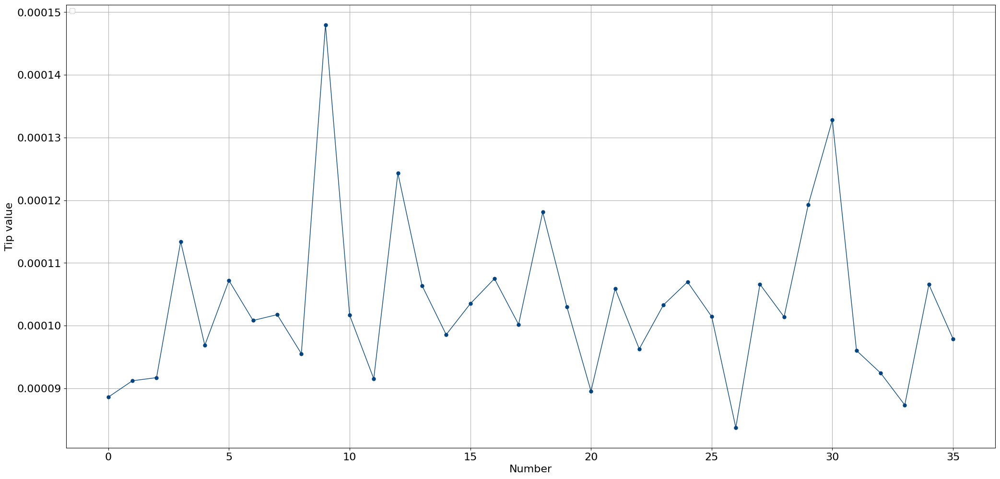

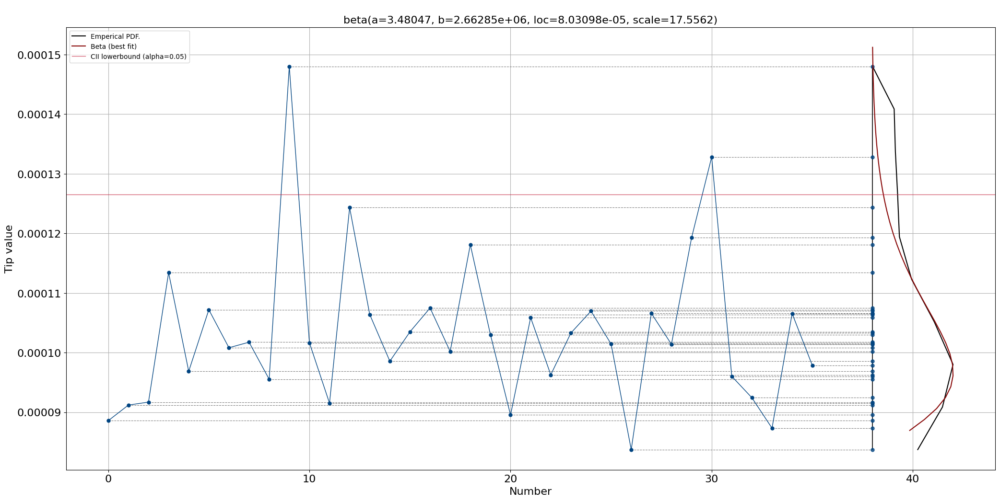

In [161]:
# Initialize
dfit = distfit(smooth=3, bound='up')
# Import
df = set1_good
# Make line plot without any fitting
dfit.lineplot(df["B1_x_freq_band_1"], xlabel='Number', ylabel='Tip value', grid=True, line_properties={'marker':'.'})

# Fit
dfit.fit_transform(df["B1_x_freq_band_1"])
# Create line plot but now with the distribution
dfit.lineplot(df["B1_x_freq_band_1"], xlabel='Number', ylabel='Tip value', grid=True, line_properties={'marker':'.'}, projection=True)

[distfit] >INFO> Ploting Summary.


(<Figure size 2000x1000 with 1 Axes>,
 <AxesSubplot:title={'center':'T (best fit)'}, xlabel='Probability Density Function (PDF)', ylabel='RSS (goodness of fit test)'>)

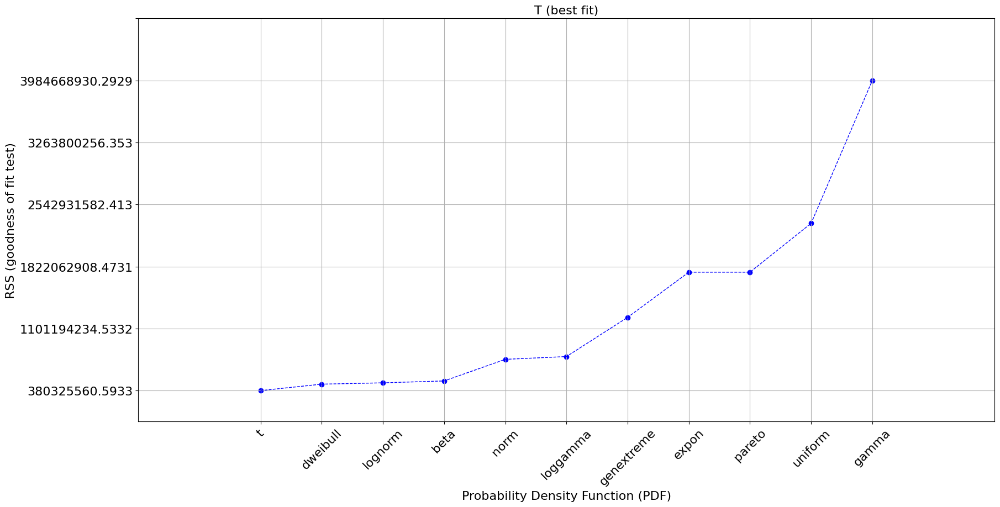

In [153]:
dfit.plot_summary()

[distfit] >INFO> Ploting Summary.


(<Figure size 2000x1000 with 1 Axes>,
 <AxesSubplot:title={'center':'Lognorm (best fit)'}, xlabel='Probability Density Function (PDF)', ylabel='RSS (goodness of fit test)'>)

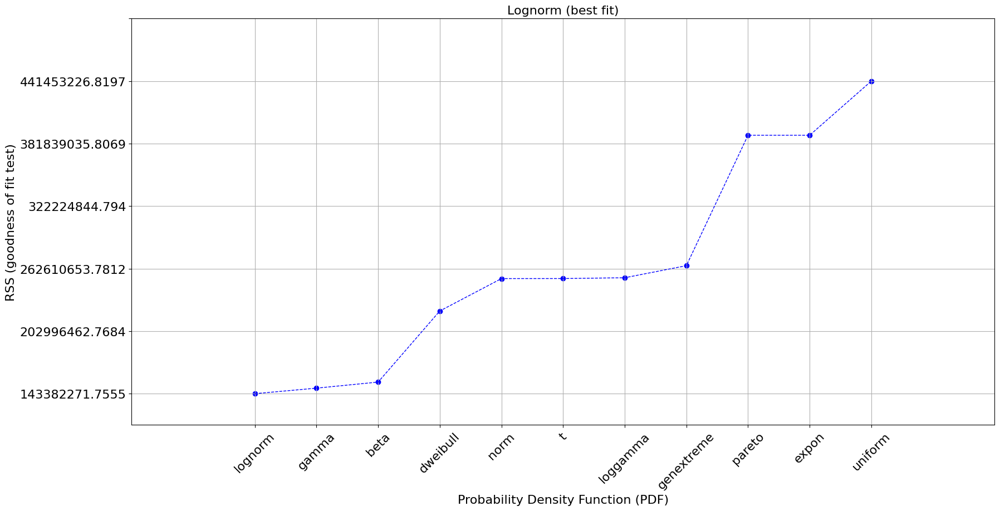

In [155]:
dfit.plot_summary()

In [23]:
# stat.ttest_ind(x1, x2, alternative='two-sided', usevar='pooled', weights=(None, None), value=0)
t_stat = stat.ttest_ind(set1_good["B1_x_freq_band_1"].values, set1_good["B1_x_freq_band_1"].values)
print (t_stat)
t_stat = stat.ttest_ind(set1_good["B1_x_freq_band_1"].values, set1_middle1["B1_x_freq_band_1"].values)
print (t_stat)
t_stat = stat.ttest_ind(set1_good["B1_x_freq_band_1"].values, set1_middle2["B1_x_freq_band_1"].values)
print (t_stat)
t_stat = stat.ttest_ind(set1_good["B1_x_freq_band_1"].values, set1_bad["B1_x_freq_band_1"].values)
print (t_stat)

(0.0, 1.0, 70.0)
(0.008872068286098803, 0.9929464433371961, 70.0)
(-9.77877663898837, 1.0043374369551076e-14, 70.0)
(-12.233599196172678, 4.736586342305706e-19, 70.0)


In [18]:
# stat.ztest(x1, x2=None, value=0, alternative='two-sided', usevar='pooled', ddof=1.0) 0.0003291
z_stat = stat.ztest(set1_good["B1_x_freq_band_1"], x2=None, value= 5.68985, alternative='two-sided')
print (z_stat)

(-8026574.479903986, 0.0)


In [65]:
from array import array
import random
print (len(set1_good["B1_x_freq_band_1"]))
ref= np.ones(400, dtype = int)
ref = [x+random.randint(0, 10000) for x in ref]
ref = np.array(ref)
print (type(ref))
print (type(set1_good["B1_x_freq_band_1"].values))

400
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [86]:
D2 = entropy(set1_good["B1_x_freq_band_1"].values, set1_bad["B1_x_freq_band_1"].values)
print (D2)
D1 = entropy(set1_good["B1_x_freq_band_1"].values, set1_middle2["B1_x_freq_band_1"].values)
print (D1)
D3 = entropy(set1_good["B1_x_freq_band_1"].values, set1_good["B1_x_freq_band_1"].values)
print (D3)

0.018558354072605268
0.014233924800472461
0.0


In [36]:
mean1, std1 = set1_good.mean(), set1_good.std()
mean2, std2 = set1_bad.mean(), set1_bad.std()
test_statistic_good = (np.mean(set1_good) - mean1) / (std1 / np.sqrt(len(set1_good)))
test_statistic_bad = (np.mean(set1_bad) - mean1) / (std1 / np.sqrt(len(set1_bad)))
#Select the distribution in "gamma"
p_value_good = st.gamma.sf(abs(test_statistic_good), len(set1_good)-1)
p_value_bad = st.gamma.sf(abs(test_statistic_bad), len(set1_bad)-1)
print (np.std(set1_good.values))
print (np.std(set1_bad.values))

4.350198296114099e-05
7.366414757809348e-05


In [82]:
def evaluator_KL(x, window):
    # window n * 10 mins
    lenght= int(len(x)/window)
    len_col= len(x.columns)
    res = np.zeros((len_col,lenght - 1), dtype= float) #2156/36
    i = 0
    j = 0
    index_s = 0
    for x_label, __ in x.items():
        for index_s in range (window, len(x), window):
            index_e= index_s + window
            if (index_e <= len(x)):
                temp_window1 = x [0 : window]
            else:
                break
            temp_window2 = x [index_s : index_e]
            res [j][i] = entropy(temp_window1[x_label].values, temp_window2[x_label].values)
            i += 1
        i= 0
        j += 1
    return res

def evaluator_Ttest(x, window):
    # window n * 10 mins
    lenght= int(len(x)/window)
    len_col= len(x.columns)
    res = np.zeros((len_col,lenght - 1), dtype= float) #2156/36
    i = 0
    j = 0
    index_s = 0
    for x_label, __ in x.items():
        for index_s in range (window, len(x), window):
            index_e= index_s + window
            if (index_e <= len(x)):
                temp_window1 = x [0 : window]
            else:
                break
            temp_window2 = x [index_s : index_e]
            res [j][i] = stat.ttest_ind(temp_window1[x_label].values, temp_window2[x_label].values)[1]
            i += 1
        i = 0
        j += 1
    return res

def evaluator_SD(x, window):
    # window n * 10 mins
    lenght= int(len(x)/window)
    len_col= len(x.columns)
    res = np.zeros((len_col,lenght - 1), dtype= float) #2156/36
    i = 0
    j = 0
    index_s = 0
    for x_label, __ in x.items():
        for index_s in range (window, len(x), window):
            index_e= index_s + window
            if (index_e > len(x)):
                break
            temp_window = x [index_s : index_e]
            res [j][i] = np.std(temp_window[x_label].values)
            i += 1
        i = 0
        j += 1
    return res

In [62]:
def moving_average(x, w):
    len_col= len(x)
    len_row= len(x[0])
    res= np.zeros((len_col,len_row), dtype= float)
    print (res.shape)
    for count in range(0,len_col, 1):
        print (x[count].shape)
        print (res[count].shape)
        res[count]= np.convolve(x[count], np.ones(w), 'valid') / w 
    return res 

In [115]:
window= 200
average_offset= int(400/window)
#break_in_offset= int(400/window) - 1
break_in_offset= 0
#minutes= window *10
minutes= window
eval_KL= evaluator_KL(set_analytic_x, window)
eval_t_test= evaluator_Ttest(set_analytic_x, window)
eval_SD= evaluator_SD(set_analytic_x, window)
print (eval_KL.shape)

(5, 9)


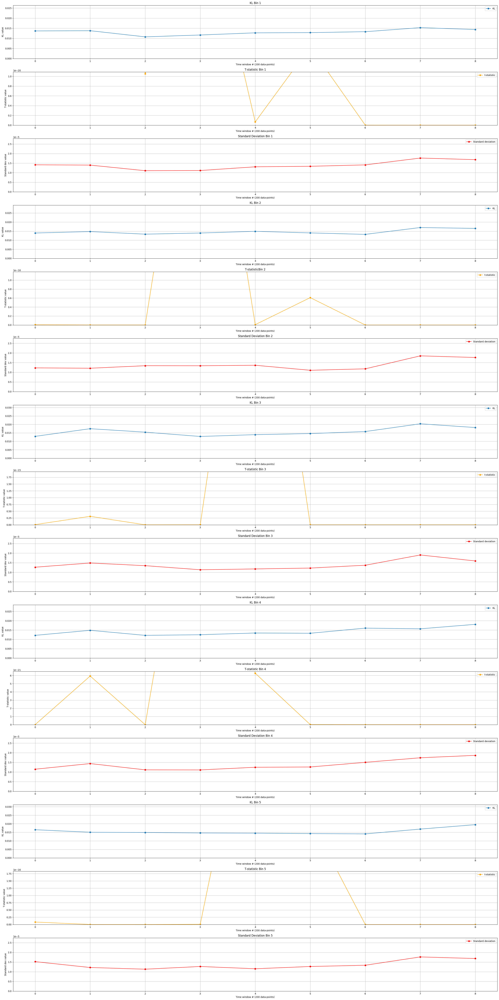

In [116]:
fig, (ax0, ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14) = plt.subplots(figsize=(30, 60), nrows=15)
ax0.plot(eval_KL[0][break_in_offset:], label='KL', marker='o')
ax0.set_title("KL Bin 1")
ax0.set_xlabel("Time window # ({} data-points)".format(minutes))
ax0.set_ylabel("KL value")
ax0.legend()
ax1.plot(eval_t_test[0][break_in_offset:], label='t-statistic', color= 'orange', marker='o')
ax1.set_title("T-statistic Bin 1")
ax1.set_xlabel("Time window # ({} data-points)".format(minutes))
ax1.set_ylabel("T-statistic value")
ax1.legend()
ax2.plot(eval_SD[0][break_in_offset:], label='Standard deviation', color= 'red', marker='o')
ax2.set_title("Standard Deviation Bin 1")
ax2.set_xlabel("Time window # ({} data-points)".format(minutes))
ax2.set_ylabel("Standard dev value")
ax2.legend()

ax3.plot(eval_KL[1][break_in_offset:], label='KL', marker='o')
ax3.set_title("KL Bin 2")
ax3.set_xlabel("Time window # ({} data-points)".format(minutes))
ax3.set_ylabel("KL value")
ax3.legend()
ax4.plot(eval_t_test[1][break_in_offset:], label='t-statistic', color= 'orange', marker='o')
ax4.set_title("T-statisticBin 2")
ax4.set_xlabel("Time window # ({} data-points)".format(minutes))
ax4.set_ylabel("T-statistic value")
ax4.legend()
ax5.plot(eval_SD[1][break_in_offset:], label='Standard deviation', color= 'red', marker='o')
ax5.set_title("Standard Deviation Bin 2")
ax5.set_xlabel("Time window # ({} data-points)".format(minutes))
ax5.set_ylabel("Standard dev value")
ax5.legend()

ax6.plot(eval_KL[2][break_in_offset:], label='KL', marker='o')
ax6.set_title("KL Bin 3")
ax6.set_xlabel("Time window # ({} data-points)".format(minutes))
ax6.set_ylabel("KL value")
ax6.legend()
ax7.plot(eval_t_test[2][break_in_offset:], label='t-statistic', color= 'orange', marker='o')
ax7.set_title("T-statistic Bin 3")
ax7.set_xlabel("Time window # ({} data-points)".format(minutes))
ax7.set_ylabel("T-statistic value")
ax7.legend()
ax8.plot(eval_SD[2][break_in_offset:], label='Standard deviation', color= 'red', marker='o')
ax8.set_title("Standard Deviation Bin 3")
ax8.set_xlabel("Time window # ({} data-points)".format(minutes))
ax8.set_ylabel("Standard dev value")
ax8.legend()

ax9.plot(eval_KL[3][break_in_offset:], label='KL', marker='o')
ax9.set_title("KL Bin 4")
ax9.set_xlabel("Time window # ({} data-points)".format(minutes))
ax9.set_ylabel("KL value")
ax9.legend()
ax10.plot(eval_t_test[3][break_in_offset:], label='t-statistic', color= 'orange', marker='o')
ax10.set_title("T-statistic Bin 4")
ax10.set_xlabel("Time window # ({} data-points)".format(minutes))
ax10.set_ylabel("T-statistic value")
ax10.legend()
ax11.plot(eval_SD[3][break_in_offset:], label='Standard deviation', color= 'red', marker='o')
ax11.set_title("Standard Deviation Bin 4")
ax11.set_xlabel("Time window # ({} data-points)".format(minutes))
ax11.set_ylabel("Standard dev value")
ax11.legend()

ax12.plot(eval_KL[4][break_in_offset:], label='KL', marker='o')
ax12.set_title("KL Bin 5")
ax12.set_xlabel("Time window # ({} data-points)".format(minutes))
ax12.set_ylabel("KL value")
ax12.legend()
ax13.plot(eval_t_test[4][break_in_offset:], label='t-statistic', color= 'orange', marker='o')
ax13.set_title("T-statistic Bin 5")
ax13.set_xlabel("Time window # ({} data-points)".format(minutes))
ax13.set_ylabel("T-statistic value")
ax13.legend()
ax14.plot(eval_SD[4][break_in_offset:], label='Standard deviation', color= 'red', marker='o')
ax14.set_title("Standard Deviation Bin 5")
ax14.set_xlabel("Time window # ({} data-points)".format(minutes))
ax14.set_ylabel("Standard dev value")
ax14.legend()

ax0.set_ylim([0, np.average(eval_KL[0])* 2])
ax1.set_ylim([0, np.average(eval_t_test[0][average_offset:])])
ax2.set_ylim([0, np.average(eval_SD[0])* 2])

ax3.set_ylim([0, np.average(eval_KL[1])* 2])
ax4.set_ylim([0, np.average(eval_t_test[1][average_offset:])])
ax5.set_ylim([0, np.average(eval_SD[1])* 2])

ax6.set_ylim([0, np.average(eval_KL[2])* 2])
ax7.set_ylim([0, np.average(eval_t_test[2][average_offset:])])
ax8.set_ylim([0, np.average(eval_SD[2])* 2])

ax9.set_ylim([0, np.average(eval_KL[3])* 2])
ax10.set_ylim([0, np.average(eval_t_test[3][average_offset:])])
ax11.set_ylim([0, np.average(eval_SD[3])* 2])

ax12.set_ylim([0, np.average(eval_KL[4])* 2])
ax13.set_ylim([0, np.average(eval_t_test[4][average_offset:])])
ax14.set_ylim([0, np.average(eval_SD[4])* 2])


ax0.grid()
ax1.grid()
ax2.grid()
ax3.grid()
ax4.grid()
ax5.grid()
ax6.grid()
ax7.grid()
ax8.grid()
ax9.grid()
ax10.grid()
ax11.grid()
ax12.grid()
ax13.grid()
ax14.grid()

#fig.suptitle('Window size {} or {} minutes of recording'.format(window, minutes))
fig.tight_layout()

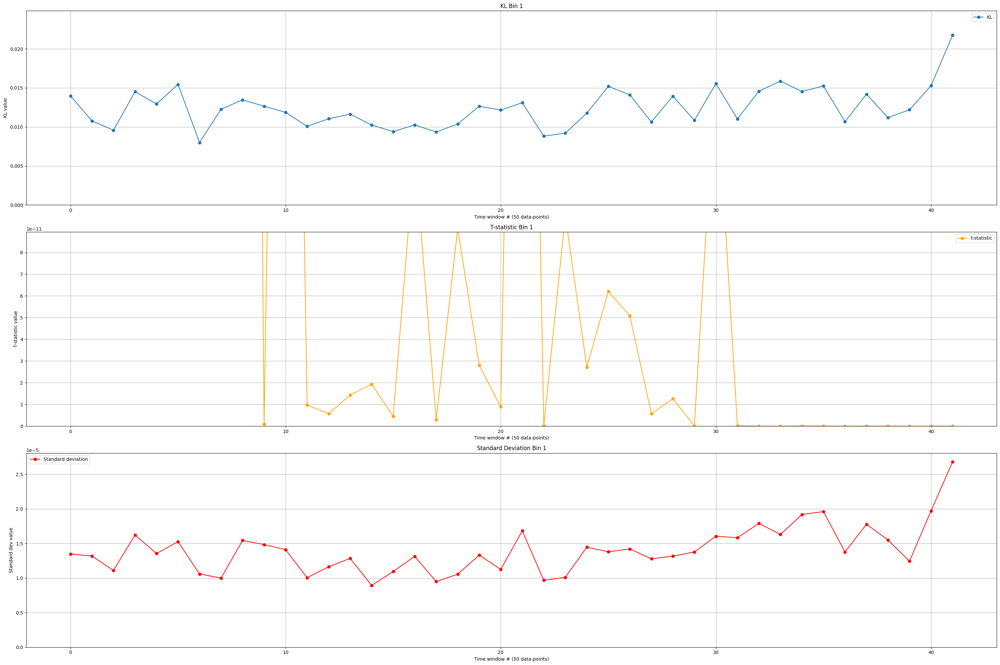

In [114]:
fig, (ax0, ax1, ax2) = plt.subplots(figsize=(30, 20), nrows=3)
ax0.plot(eval_KL[0][break_in_offset:], label='KL', marker='o')
ax0.set_title("KL Bin 1")
ax0.set_xlabel("Time window # ({} data-points)".format(minutes))
ax0.set_ylabel("KL value")
ax0.legend()
ax1.plot(eval_t_test[0][break_in_offset:], label='t-statistic', color= 'orange', marker='o')
ax1.set_title("T-statistic Bin 1")
ax1.set_xlabel("Time window # ({} data-points)".format(minutes))
ax1.set_ylabel("T-statistic value")
ax1.legend()
ax2.plot(eval_SD[0][break_in_offset:], label='Standard deviation', color= 'red', marker='o')
ax2.set_title("Standard Deviation Bin 1")
ax2.set_xlabel("Time window # ({} data-points)".format(minutes))
ax2.set_ylabel("Standard dev value")
ax2.legend()

# ax3.plot(eval_KL[1][break_in_offset:], label='KL', marker='o')
# ax3.set_title("KL Bin 2")
# ax3.set_xlabel("Time window # ({} data-points)".format(minutes))
# ax3.set_ylabel("KL value")
# ax3.legend()
# ax4.plot(eval_t_test[1][break_in_offset:], label='t-statistic', color= 'orange', marker='o')
# ax4.set_title("T-statisticBin 2")
# ax4.set_xlabel("Time window # ({} data-points)".format(minutes))
# ax4.set_ylabel("T-statistic value")
# ax4.legend()
# ax5.plot(eval_SD[1][break_in_offset:], label='Standard deviation', color= 'red', marker='o')
# ax5.set_title("Standard Deviation Bin 2")
# ax5.set_xlabel("Time window # ({} data-points)".format(minutes))
# ax5.set_ylabel("Standard dev value")
# ax5.legend()

# ax6.plot(eval_KL[2][break_in_offset:], label='KL', marker='o')
# ax6.set_title("KL Bin 3")
# ax6.set_xlabel("Time window # ({} data-points)".format(minutes))
# ax6.set_ylabel("KL value")
# ax6.legend()
# ax7.plot(eval_t_test[2][break_in_offset:], label='t-statistic', color= 'orange', marker='o')
# ax7.set_title("T-statistic Bin 3")
# ax7.set_xlabel("Time window # ({} data-points)".format(minutes))
# ax7.set_ylabel("T-statistic value")
# ax7.legend()
# ax8.plot(eval_SD[2][break_in_offset:], label='Standard deviation', color= 'red', marker='o')
# ax8.set_title("Standard Deviation Bin 3")
# ax8.set_xlabel("Time window # ({} data-points)".format(minutes))
# ax8.set_ylabel("Standard dev value")
# ax8.legend()

# ax9.plot(eval_KL[3][break_in_offset:], label='KL', marker='o')
# ax9.set_title("KL Bin 4")
# ax9.set_xlabel("Time window # ({} data-points)".format(minutes))
# ax9.set_ylabel("KL value")
# ax9.legend()
# ax10.plot(eval_t_test[3][break_in_offset:], label='t-statistic', color= 'orange', marker='o')
# ax10.set_title("T-statistic Bin 4")
# ax10.set_xlabel("Time window # ({} data-points)".format(minutes))
# ax10.set_ylabel("T-statistic value")
# ax10.legend()
# ax11.plot(eval_SD[3][break_in_offset:], label='Standard deviation', color= 'red', marker='o')
# ax11.set_title("Standard Deviation Bin 4")
# ax11.set_xlabel("Time window # ({} data-points)".format(minutes))
# ax11.set_ylabel("Standard dev value")
# ax11.legend()

# ax12.plot(eval_KL[4][break_in_offset:], label='KL', marker='o')
# ax12.set_title("KL Bin 5")
# ax12.set_xlabel("Time window # ({} data-points)".format(minutes))
# ax12.set_ylabel("KL value")
# ax12.legend()
# ax13.plot(eval_t_test[4][break_in_offset:], label='t-statistic', color= 'orange', marker='o')
# ax13.set_title("T-statistic Bin 5")
# ax13.set_xlabel("Time window # ({} data-points)".format(minutes))
# ax13.set_ylabel("T-statistic value")
# ax13.legend()
# ax14.plot(eval_SD[4][break_in_offset:], label='Standard deviation', color= 'red', marker='o')
# ax14.set_title("Standard Deviation Bin 5")
# ax14.set_xlabel("Time window # ({} data-points)".format(minutes))
# ax14.set_ylabel("Standard dev value")
# ax14.legend()

ax0.set_ylim([0, np.average(eval_KL[0])* 2])
ax1.set_ylim([0, np.average(eval_t_test[0][average_offset:])])
ax2.set_ylim([0, np.average(eval_SD[0])* 2])

# ax3.set_ylim([0, np.average(eval_KL[1])* 2])
# ax4.set_ylim([0, np.average(eval_t_test[1][average_offset:])])
# ax5.set_ylim([0, np.average(eval_SD[1])* 2])

# ax6.set_ylim([0, np.average(eval_KL[2])* 2])
# ax7.set_ylim([0, np.average(eval_t_test[2][average_offset:])])
# ax8.set_ylim([0, np.average(eval_SD[2])* 2])

# ax9.set_ylim([0, np.average(eval_KL[3])* 2])
# ax10.set_ylim([0, np.average(eval_t_test[3][average_offset:])])
# ax11.set_ylim([0, np.average(eval_SD[3])* 2])

# ax12.set_ylim([0, np.average(eval_KL[4])* 2])
# ax13.set_ylim([0, np.average(eval_t_test[4][average_offset:])])
# ax14.set_ylim([0, np.average(eval_SD[4])* 2])


ax0.grid()
ax1.grid()
ax2.grid()
# ax3.grid()
# ax4.grid()
# ax5.grid()
# ax6.grid()
# ax7.grid()
# ax8.grid()
# ax9.grid()
# ax10.grid()
# ax11.grid()
# ax12.grid()
# ax13.grid()
# ax14.grid()

#fig.suptitle('Window size {} or {} minutes of recording'.format(window, minutes))
fig.tight_layout()

In [25]:
threshold= 0.015
i,  = np.where(eval_KL [0]> threshold)
print (i)

[8]


[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 7.436e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 1.75637e+09] [loc=0.000 scale=0.000]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 1.75637e+09] [loc=-921.600 scale=921.600]
[distfit] >INFO> [dweibull  ] [0.08 sec] [RSS: 4.55246e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [t         ] [0.13 sec] [RSS: 3.80326e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [genextreme] [0.22 sec] [RSS: 1.23147e+09] [loc=0.000 scale=0.000]
[distfit] >INFO> [gamma     ] [0.11 sec] [RSS: 3.98467e+09] [loc=0.000 scale=1.311]
[distfit] >INFO> [lognorm   ] [0.16 sec] [RSS: 4.70635e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [beta      ] [0.17 sec] [RSS: 4.92426e+08] [loc=0.000 scale=17.556]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 2.32442e+09] [loc=0.000 scale=0.000]
[distfit] >INFO> [loggamma  ] [0.13 sec] [RSS: 7.76027e+08] [loc=-0.004 scale=0.001]
[distfit] >INFO> Comput

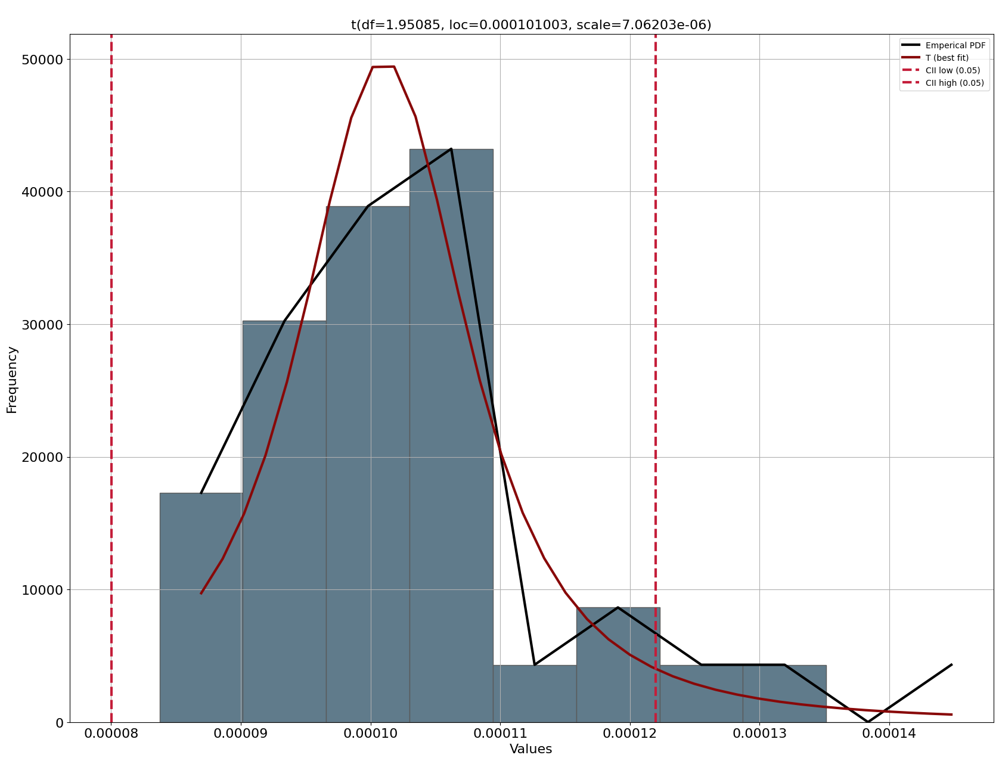

In [19]:
dfit = distfit(todf=True)
results = dfit.fit_transform(set1_good["B1_x_freq_band_1"].to_numpy())
im = dfit.plot()

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 2.53117e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 3.89808e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [pareto    ] [0.00 sec] [RSS: 3.89808e+08] [loc=-4096.000 scale=4096.000]
[distfit] >INFO> [dweibull  ] [0.04 sec] [RSS: 2.22223e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [t         ] [0.11 sec] [RSS: 2.53162e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [genextreme] [0.13 sec] [RSS: 2.6544e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [gamma     ] [0.02 sec] [RSS: 1.48659e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [lognorm   ] [0.13 sec] [RSS: 1.43382e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [beta      ] [0.13 sec] [RSS: 1.54442e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 4.41453e+08] [loc=0.000 scale=0.000]
[distfit] >INFO> [loggamma  ] [0.13 sec] [RSS: 2.53932e+08] [loc=-0.008 scale=0.001]
[distfit] >INFO> Comp

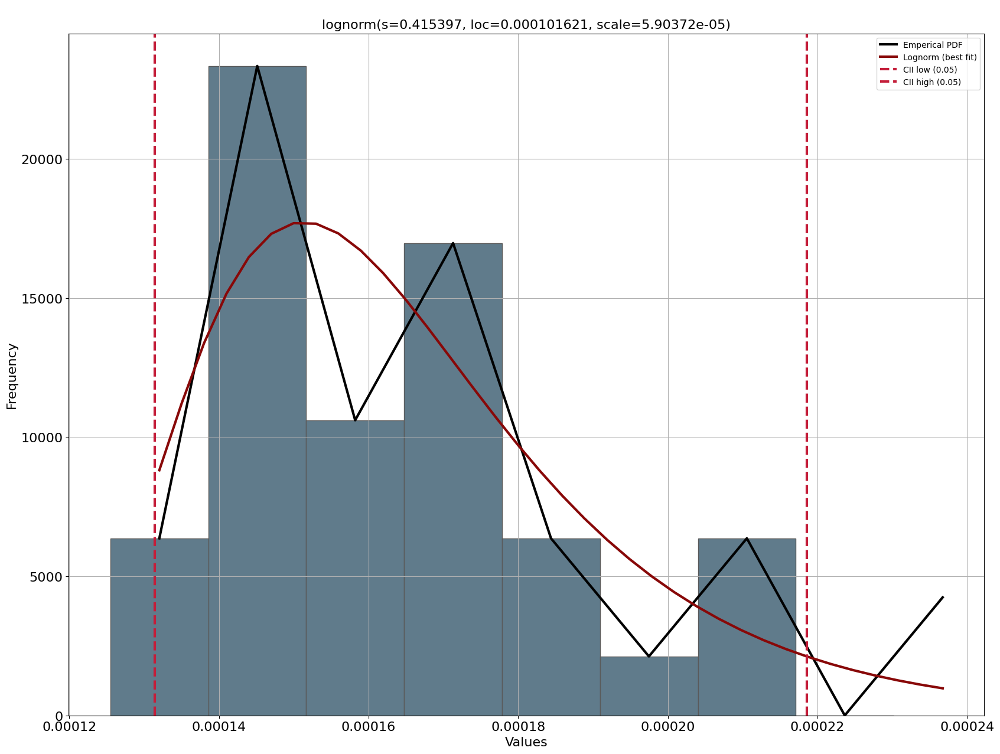

In [20]:
dfit = distfit(todf=True)
results = dfit.fit_transform(set1_bad["B1_x_freq_band_1"].to_numpy())
im = dfit.plot()

# Labeling

In [ ]:
#Health Status labels are added according to following dictionary
B1 ={
    "early" : ["2003-10-22 12:06:24" , "2003-10-23 09:14:13"],
    "suspect" : ["2003-10-23 09:24:13" , "2003-11-08 12:11:44"],
    "normal" : ["2003-11-08 12:21:44" , "2003-11-19 21:06:07"],
    "suspect_1" : ["2003-11-19 21:16:07" , "2003-11-24 20:47:32"],
    "imminent_failure" : ["2003-11-24 20:57:32","2003-11-25 23:39:56"]
}
B2 = {
    "early" : ["2003-10-22 12:06:24" , "2003-11-01 21:41:44"],
    "normal" : ["2003-11-01 21:51:44" , "2003-11-24 01:01:24"],
    "suspect" : ["2003-11-24 01:11:24" , "2003-11-25 10:47:32"],
    "imminient_failure" : ["2003-11-25 10:57:32" , "2003-11-25 23:39:56"]
}

B3 = {
    "early" : ["2003-10-22 12:06:24" , "2003-11-01 21:41:44"],
    "normal" : ["2003-11-01 21:51:44" , "2003-11-22 09:16:56"],
    "suspect" : ["2003-11-22 09:26:56" , "2003-11-25 10:47:32"],
    "Inner_race_failure" : ["2003-11-25 10:57:32" , "2003-11-25 23:39:56"]
}

B4 = {
    "early" : ["2003-10-22 12:06:24" , "2003-10-29 21:39:46"],
    "normal" : ["2003-10-29 21:49:46" , "2003-11-15 05:08:46"],
    "suspect" : ["2003-11-15 05:18:46" , "2003-11-18 19:12:30"],
    "Rolling_element_failure" : ["2003-11-19 09:06:09" , "2003-11-22 17:36:56"],
    "Stage_two_failure" : ["2003-11-22 17:46:56" , "2003-11-25 23:39:56"]
}


Splitting each bearing data and adding them end to end vertically

In [ ]:
B1_cols = [col for col in set1.columns if "B1" in col]
B2_cols = [col for col in set1.columns if "B2" in col]
B3_cols = [col for col in set1.columns if "B3" in col]
B4_cols = [col for col in set1.columns if "B4" in col]

B1 = set1[B1_cols]
B2 = set1[B2_cols]
B3 = set1[B3_cols]
B4 = set1[B4_cols]
cols = ['Bx_mean','Bx_std','Bx_skew','Bx_kurtosis','Bx_entropy','Bx_rms','Bx_max','Bx_p2p','Bx_crest', 'Bx_clearence', 'Bx_shape', 'Bx_impulse',
        'By_mean','By_std','By_skew','By_kurtosis','By_entropy','By_rms','By_max','By_p2p','By_crest', 'By_clearence', 'By_shape', 'By_impulse',
        'class']
B1.columns = cols
B2.columns = cols
B3.columns = cols
B4.columns = cols
final_data = pd.concat([B1,B2,B3,B4], axis=0, ignore_index=True)
final_data.describe()

In [ ]:
set2 = time_features(dataset_path_2nd, id_set=2)
set2.to_csv('set2_timefeatures.csv')
set3 = time_features(dataset_path_3rd, id_set=3)
set3.to_csv('set3_timefeatures.csv')

In [ ]:
set2 = pd.read_csv("./set2_timefeatures.csv")
set3 = pd.read_csv("./set3_timefeatures.csv")
time_2 = set2['Unnamed: 0']
#Setting index columns to time
set2 = set2.rename(columns={'Unnamed: 0':'time'}).set_index('time')
set3 = set3.rename(columns={'Unnamed: 0':'time'}).set_index('time')

In [ ]:
B1_cols = [col for col in set2.columns if "B1" in col]
B2_cols = [col for col in set2.columns if "B2" in col]
B3_cols = [col for col in set2.columns if "B3" in col]
B4_cols = [col for col in set2.columns if "B4" in col]

set2_B1 = set2[B1_cols]
set2_B2 = set2[B2_cols]
set2_B3 = set2[B3_cols]
set2_B4 = set2[B4_cols]

set3_B1 = set3[B1_cols]
set3_B2 = set3[B2_cols]
set3_B3 = set3[B3_cols]
set3_B4 = set3[B4_cols]

set2_B1.columns = cols
set2_B2.columns = cols
set2_B3.columns = cols
set2_B4.columns = cols
set3_B1.columns = cols
set3_B2.columns = cols
set3_B3.columns = cols
set3_B4.columns = cols
